## NLP Class Final Project Read Data

In [2]:
#df_analysis = pd.read_parquet('df_analysis.parquet', engine='pyarrow')
#- seperated from df_analysis into positive and negative
#df_positive = pd.read_parquet('df_positive.parquet', engine='pyarrow')
#df_negative = pd.read_parquet('df_negative.parquet', engine='pyarrow')
#lda_model_266 = topics on 37 topics of general corpus (it is 37 because i probably reduced it)
#lda_model_266 = topics on 37 topics of general corpus


In [91]:
import torch

print("CUDA is available:" , torch.cuda.is_available())
print("Number of CUDA devices:", torch.cuda.device_count())
print("CUDA version used by PyTorch:", torch.version.cuda)

for i in range(torch.cuda.device_count()):
    print(torch.cuda.get_device_name(i)) # prints the name of each available GPU

CUDA is available: True
Number of CUDA devices: 2
CUDA version used by PyTorch: 11.6
Tesla T4
Tesla T4


In [92]:
import numpy as np
import pandas as pd
# from gensim import corpora, models
# from gensim.models import Phrases
# from gensim.models import CoherenceModel
# from gensim.models.ldamodel import LdaModel
# from gensim.models.ldamulticore import LdaMulticore

#import pyLDAvis
#import pyLDAvis.gensim_models as gensimvis
from tqdm import tqdm

import re
import nltk
import os
import seaborn as sns

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 600)

In [140]:
#nltk.download('stopwords')

In [141]:
#!pip install gensim

In [142]:
#!pip install pyLDAvis

In [143]:
#!pip install nltk

In [144]:
#!pip install pyarrow    

In [95]:
%%time

df_news_final_project = pd.read_parquet('https://storage.googleapis.com/msca-bdp-data-open/news_final_project/news_final_project.parquet', engine='pyarrow')
df_news_final_project.shape

CPU times: user 6.78 s, sys: 3.92 s, total: 10.7 s
Wall time: 14 s


(200332, 5)

In [96]:
#save this dataframe so i do not have to keep reading it in
#df_news_final_project.to_parquet('news_final_project.parquet', engine='pyarrow')

In [97]:
#!pip install pandarallel

In [93]:
import pandarallel
from pandarallel import pandarallel

In [94]:
import multiprocessing

num_processors = multiprocessing.cpu_count()

# Now you can use num_processors in your code.


In [95]:
pandarallel.initialize(nb_workers=num_processors-1, use_memory_fs=False)

INFO: Pandarallel will run on 31 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [101]:
# expand length of column width
pd.set_option('display.max_colwidth', 1000)

In [102]:
#df_news_final_project.head()

In [103]:
# value counts of language
df_news_final_project['language'].value_counts()

en    200332
Name: language, dtype: int64

In [104]:
#around 60k news articles with the same titles
#around 1500 news articles with the same text - removed this 


In [105]:
#decided to only drop the same text because it may be the same articles
#im going to later analyze news articles with same titles to show importance! this will be important to see trends
df_news_final_project = df_news_final_project.drop_duplicates(subset=['text'])
df_news_final_project.shape

(198564, 5)

In [106]:
#take a sample of 1000 rows
#df_news_final_project_sample = df_news_final_project.sample(n=1000, random_state=1)

In [107]:
# reset index
df_news_final_project.reset_index(drop=True, inplace=True)


In [117]:
%%time

# Clean-up the noise, by eliminating newlines, tabs, remnants of web crawls, and other irrelevant text
import re
df_news_final_project['content_clean'] = df_news_final_project['text'].str.replace('\n', ' ') 
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('\t', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('\r', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<!--.*?-->', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<script.*?>.*?</script>', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('<.*?>', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('http\S+|www.\S+', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('\s+', ' ')
df_news_final_project['content_clean'] = df_news_final_project['content_clean'].str.replace('^\s+|\s+$', ' ')



CPU times: user 2min 58s, sys: 4.42 s, total: 3min 3s
Wall time: 3min 2s


In [118]:
%%time
def clean_text(text):
    # Remove sentences with word length greater than 80
    sentences = re.split(r'(?<=[.!?])\s+', text)
    cleaned_sentences = [sentence for sentence in sentences if not any(len(word) > 80 for word in sentence.split())]
    
    # Remove words with more than 20 letters
    cleaned_text = ' '.join([word for sentence in cleaned_sentences for word in sentence.split() if len(word) <= 20])
    
    return cleaned_text

df_news_final_project['content_clean'] = df_news_final_project['content_clean'].apply(clean_text)


CPU times: user 1min 43s, sys: 32.6 ms, total: 1min 43s
Wall time: 1min 43s


In [148]:
pd.set_option('display.max_colwidth', 1000)


#### entity extraction on uncleaned text

In [121]:
ai_terms = ["Artificial Intelligence", "Machine Learning", "Deep Learning", "Neural Network", "Natural Language Processing", "Supervised Learning", "Unsupervised Learning", "Reinforcement Learning", "Generative Adversarial Networks", "Convolutional Neural Networks", "Recurrent Neural Networks", "Transfer Learning", "Data Mining", "Big Data", "Algorithm","large language models","llms","robotics","Chatbot", "Robotic Process Automation", "Computer Vision", "Image Recognition", "Speech Recognition", "Text Analytics", "Sentiment Analysis", "Autonomous Vehicles", "Internet of Things", "Edge Computing", "Quantum Computing"]


In [122]:
#filter dataframe 
ai_terms = '|'.join(ai_terms)


In [125]:
df_news_final_project = df_news_final_project[df_news_final_project['content_clean'].str.contains(ai_terms, case=False, na=False)]


In [150]:
#df_news_final_project.head(1)

In [151]:
df_news_final_project.to_parquet('content_clean_spacy_final_project.parquet', engine='pyarrow')

In [131]:
df_analysis_sample = df_news_final_project.sample(n=1000)  # Adjust the sample size as needed


In [132]:
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])


In [133]:
%%time
# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON', 'NORP']

# Function to extract top entities by label and year
def extract_top_entities_by_label_and_year(documents, label):
    entities_by_year = {}
    for doc, year in zip(nlp.pipe(documents), df_analysis_sample['date'].dt.year):
        if year not in entities_by_year:
            entities_by_year[year] = []
        entities_by_year[year].extend([ent.text for ent in doc.ents if ent.label_ == label])
    return entities_by_year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    top_entities_by_label_and_year = extract_top_entities_by_label_and_year(df_analysis_sample['content_clean'], label)
    max_length = max(len(entities) for entities in top_entities_by_label_and_year.values())
    padded_entities_by_year = {year: entities + [''] * (max_length - len(entities))
                               for year, entities in top_entities_by_label_and_year.items()}
    df_entities_by_label[label] = pd.DataFrame(padded_entities_by_year)

# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
# print(top_org_entiies)


CPU times: user 8min 28s, sys: 12.1 s, total: 8min 40s
Wall time: 8min 40s


In [ ]:
%%time

# Clean-up the noise, by eliminating newlines, tabs, remnants of web crawls, and other irrelevant text
import re
df_news_final_project['cleaned_text'] = df_news_final_project['text'].str.replace('\n', ' ') 
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].str.replace('\t', ' ')
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].str.replace('\r', ' ')
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].str.replace('<!--.*?-->', ' ')
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].str.replace('<script.*?>.*?</script>', ' ')
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].str.replace('<.*?>', ' ')
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].str.replace('http\S+|www.\S+', ' ')
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].str.replace('\s+', ' ')
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].str.replace('^\s+|\s+$', ' ')



In [26]:
import nltk
import string
stopwords = set(nltk.corpus.stopwords.words('english'))

df_news_final_project['clean_title'] = df_news_final_project['title'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_news_final_project['clean_title'] = df_news_final_project['clean_title'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df_news_final_project['cleaned_text'] = df_news_final_project['cleaned_text'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))


In [27]:
import nltk
from nltk.corpus import stopwords

stopwords = set(stopwords.words('english'))  # define stopwords

def clean(string):
    
    url_pattern = r'(http|ftp|https):\/\/([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:\/~+#-]*[\w@?^=%&\/~+#-])'
    mention_pattern = r'[\s]*@[\w]+'
    hashtag_pattern = r'[\s]*#[\w]+'
    copyright_pattern = r"©.*"
    string_fixed = re.sub(url_pattern, "", string)
    string_fixed = re.sub(hashtag_pattern, "", string_fixed)
    string_fixed = re.sub(mention_pattern, "", string_fixed)
    string_fixed = re.sub(copyright_pattern, "", string_fixed)  # Remove everything after "©"
    string_fixed = string_fixed.replace('\n', ' ')
    
    # Convert to lower case and remove stop words without tokenization
    words = string_fixed.split()  # split string into words
    words = [word.lower() for word in words if word.lower() not in stopwords and word.isalpha()]
    
    return " ".join(words)

# Applying the function to the dataframe
df_news_final_project['cleaned_text'] = df_news_final_project['content_clean'].apply(clean)


In [28]:
df_news_final_project['clean_title'] = df_news_final_project['clean_title'].apply(clean)


In [29]:
ai_terms = ["Artificial Intelligence", "Machine Learning", "Deep Learning", "Neural Network", "Natural Language Processing", "Supervised Learning", "Unsupervised Learning", "Reinforcement Learning", "Generative Adversarial Networks", "Convolutional Neural Networks", "Recurrent Neural Networks", "Transfer Learning", "Data Mining", "Big Data", "Algorithm","large language models","llms","robotics","Chatbot", "Robotic Process Automation", "Computer Vision", "Image Recognition", "Speech Recognition", "Text Analytics", "Sentiment Analysis", "Autonomous Vehicles", "Internet of Things", "Edge Computing", "Quantum Computing"]


In [30]:
#filter dataframe 
ai_terms = '|'.join(ai_terms)


In [31]:
ai_terms

'Artificial Intelligence|Machine Learning|Deep Learning|Neural Network|Natural Language Processing|Supervised Learning|Unsupervised Learning|Reinforcement Learning|Generative Adversarial Networks|Convolutional Neural Networks|Recurrent Neural Networks|Transfer Learning|Data Mining|Big Data|Algorithm|large language models|llms|robotics|Chatbot|Robotic Process Automation|Computer Vision|Image Recognition|Speech Recognition|Text Analytics|Sentiment Analysis|Autonomous Vehicles|Internet of Things|Edge Computing|Quantum Computing'

In [32]:
df_filtered = df_news_final_project[df_news_final_project['cleaned_text'].str.contains(ai_terms, case=False, na=False)]


In [33]:
df_filtered.shape

(164097, 8)

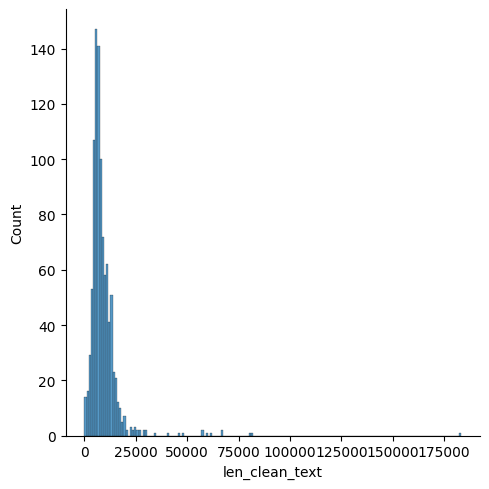

In [76]:
# #before cleaning - DONT RUN THIS
# import seaborn as sns
# df_news_final_project_sample = df_news_final_project_sample.dropna()
# df_news_final_project_sample = df_news_final_project_sample.drop_duplicates(subset=['cleaned_text'])
# df_news_final_project_sample['len_clean_text'] = df_news_final_project_sample['cleaned_text'].apply(lambda x: len(x))
# sns.displot(data=df_news_final_project_sample,x='len_clean_text')


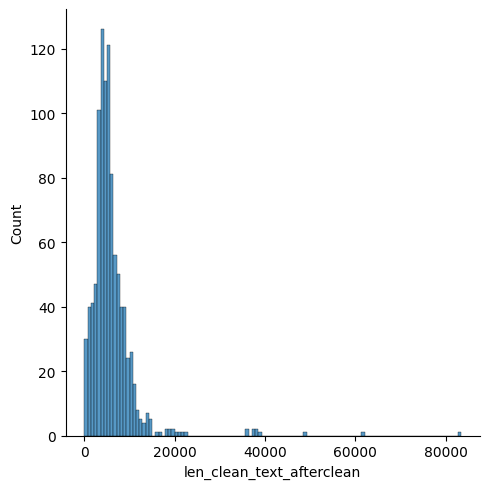

In [80]:
#after cleaning
import seaborn as sns
df_news_final_project_sample = df_news_final_project_sample.dropna()
df_news_final_project_sample = df_news_final_project_sample.drop_duplicates(subset=['cleaned_text'])
df_news_final_project_sample['len_clean_text_afterclean'] = df_news_final_project_sample['cleaned_text'].apply(lambda x: len(x))
sns.displot(data=df_news_final_project_sample,x='len_clean_text_afterclean')


In [32]:
news_df = df_news_final_project

In [33]:
news_df.shape

(198564, 8)

In [34]:
tokenizer = nltk.tokenize.TweetTokenizer()

# This creates a list of all tokenized sentences
tokenized_sentences = news_df['cleaned_text'].apply(tokenizer.tokenize).tolist()

# This will flatten the list of lists into a single list
words = [word for sublist in tokenized_sentences for word in sublist]


In [35]:
bgs = nltk.bigrams(words)
targeted_bgs = ['machine','learning','ai','artificial','intelligence','natural','language','processing','chatgpt','data','science','python','r','c','analytics','ml','nlp','generative','legal','office','law','llm','large','language','model','management','business','finance','financial','industry','healthcare','production','service','manufacture','productivity','job','GenAI']
bgs = [b for b in bgs if (b[0] in targeted_bgs) or (b[1] in targeted_bgs)]
bigrams_freq = nltk.FreqDist(bgs)
bigrams_freq_df = pd.DataFrame(bigrams_freq.most_common(),columns=['Word', 'Frequency'])
bigrams_freq_df.head(n=50)


,Word,Frequency
0,"(artificial, intelligence)",621509
1,"(machine, learning)",239444
2,"(intelligence, ai)",126521
3,"(data, science)",76450
4,"(global, artificial)",65781
5,"(generative, ai)",44736
6,"(financial, services)",43689
7,"(ai, powered)",41162
8,"(ai, technology)",39027
9,"(ai, market)",35826


In [141]:
# assuming 'words' is a list of tokenized words from your document
fourgrams = nltk.ngrams(words, 4)

targeted_fourgrams = [
    'machine', 'learning', 'ai', 'artificial', 'intelligence', 'natural', 
    'language', 'processing', 'chatgpt', 'data', 'science', 'python', 'r', 
    'c', 'analytics', 'ml', 'nlp', 'generative', 'legal', 'office', 'law', 
    'llm', 'large', 'language', 'model', 'management', 'business', 'finance', 
    'financial', 'industry', 'healthcare', 'production', 'service', 
    'manufacture', 'productivity', 'job', 'GenAI'
]

fourgrams = [
    b for b in fourgrams 
    if (b[0] in targeted_fourgrams) or (b[1] in targeted_fourgrams) 
    or (b[2] in targeted_fourgrams) or (b[3] in targeted_fourgrams)
]

fourgrams_dist = nltk.FreqDist(fourgrams)
fourgrams_dist_df = pd.DataFrame(fourgrams_dist.most_common(), columns=['Word', 'Frequency'])
fourgrams_dist_df.head(n=50)


,Word,Frequency
0,"(global, artificial, intelligence, ai)",102
1,"(artificial, intelligence, ai, service)",86
2,"(call, center, ai, market)",73
3,"(artificial, intelligence, energy, market)",71
4,"(intelligence, energy, market, market)",62
5,"(artificial, intelligencebased, security, market)",56
6,"(ai, computer, vision, market)",53
7,"(artificial, intelligence, software, market)",53
8,"(cyber, data, science, market)",52
9,"(automotive, artificial, intelligence, software)",47


# Sentiment Analysis

#### Running FinancialBert for sentiment analysis - not great results so tried more sentiment analysis models from hugging face

In [36]:
#!pip install -q transformers

In [39]:
# created on GCP Vertex AI Notebook using  `Python 3 (CUDA Toolkit 11.0)` environment
# using n1-standard-4 (4 vCPUS, 15 GB RAM) compute w/ 1 NVIDIA T4 GPU

# dependencies
#!pip install torch==1.13.1+cu116 torchvision==0.14.1+cu116 torchaudio==0.13.1 --extra-index-url https://download.pytorch.org/whl/cu116
#!pip install transformers datasets evaluate rouge-score nltk py7zr
#nltk.download("punkt")

# note: installing an older version of pytorch so that cuda versions match
# note: py7zr is needed for the `samsum` dataset, may or may not be needed for other datasets

In [140]:
#!pip install tensorflow

In [35]:
from __future__ import absolute_import, division, print_function

import collections

import math
import glob
import json

import numpy as np
import torch
from torch.utils.data import DataLoader, SequentialSampler, TensorDataset

from transformers import WEIGHTS_NAME, BertConfig, BertForQuestionAnswering, BertTokenizer
from transformers import AutoTokenizer, AutoModelForQuestionAnswering

from transformers import logging
import tensorflow as tf

logging.set_verbosity_error()
logging.get_verbosity()

# from utils import (get_answer, input_to_squad_example,
#                    squad_examples_to_features, to_list)

40

In [36]:
df_analysis = pd.read_parquet('df_analysis.parquet', engine='pyarrow')
#adding this now to do sentiment over time - get sentiment scores

In [38]:
df_filtered_sample = df_analysis.sample(n=1000, random_state=1)

In [39]:
df_filtered_sample.shape

(1000, 5)

In [ ]:
from transformers import BertTokenizer, BertForSequenceClassification
import torch

# Load pretrained model and tokenizer
model = BertForSequenceClassification.from_pretrained("ahmedrachid/FinancialBERT-Sentiment-Analysis", num_labels=3)
tokenizer = BertTokenizer.from_pretrained("ahmedrachid/FinancialBERT-Sentiment-Analysis")

# Define the maximum length for the text chunks. BERT typically works with a max_length of 512.
max_length = 512

# Function to apply sentiment analysis and manage text length
def get_sentiment_and_score(text):
    # Tokenize the text
    inputs = tokenizer(text, truncation=True, padding='longest', max_length=max_length, return_tensors='pt')
    
    # Get the model's output
    output = model(**inputs)

    # Get the sentiment
    sentiment = output.logits.argmax(dim=1).item()

    # Convert logits to probabilities
    probabilities = torch.nn.functional.softmax(output.logits, dim=-1)

    # Get the confidence score
    confidence_score = probabilities.max(dim=-1).values.item()

    # Convert the sentiment label from integer to string
    if sentiment == 0:
        sentiment = 'negative'
    elif sentiment == 1:
        sentiment = 'neutral'
    else:
        sentiment = 'positive'

    return sentiment, confidence_score

# Apply the function to the 'cleaned_text' column
df_filtered_sample['sentiment_finbert_title'], df_filtered_sample['confidence_score'] = zip(*df_filtered_sample['cleaned_text'].map(get_sentiment_and_score))


In [12]:
#value counts for sentiment column
df_filtered_sample['sentiment'].value_counts()

sentiment
neutral     741
positive    259
Name: count, dtype: int64

### Trying sentiment using siebert/sentiment-roberta-large-english - not good results

In [52]:
import torch
from transformers import pipeline

# Check if a GPU is available and if not, use a CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [44]:
from transformers import pipeline
sentiment_analysis = pipeline("sentiment-analysis",model="siebert/sentiment-roberta-large-english")
print(sentiment_analysis("I love this!"))



[{'label': 'POSITIVE', 'score': 0.9988656044006348}]


In [55]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="siebert/sentiment-roberta-large-english")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['cleaned_text'][i:i + batch_size] for i in range(0,df_filtered_sample['cleaned_text'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [1 if result['label'] == 'positive' else 0 for result in results]
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['sentiment'] = sentiments


CPU times: user 2h 42min 58s, sys: 2.37 s, total: 2h 43min
Wall time: 10min 21s


In [57]:
df_filtered_sample['sentiment'].value_counts()

0    1000
Name: sentiment, dtype: int64

#### roberta-base-sentiment - better results

In [67]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['cleaned_text'][i:i + batch_size] for i in range(0,df_filtered_sample['cleaned_text'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['sentiment_roberta_base'] = sentiments


CPU times: user 51min 41s, sys: 875 ms, total: 51min 42s
Wall time: 3min 15s


In [68]:
df_filtered_sample['sentiment_roberta_base'].value_counts()
#800 neutral for title

LABEL_1    987
LABEL_0      7
LABEL_2      6
Name: sentiment_roberta_base, dtype: int64

In [69]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="shashanksrinath/News_Sentiment_Analysis")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['clean_title'][i:i + batch_size] for i in range(0,df_filtered_sample['clean_title'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['sentiment_srikanth_title'] = sentiments


CPU times: user 5min 29s, sys: 1.04 s, total: 5min 30s
Wall time: 30.6 s


In [70]:
df_filtered_sample['sentiment_srikanth_title'].value_counts()
#1000 neutral for text

Neutral     923
Positive     40
Negative     37
Name: sentiment_srikanth_title, dtype: int64

#### tried another model called news_sentiment_analysis - not good results 

In [71]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="shashanksrinath/News_Sentiment_Analysis")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['cleaned_text'][i:i + batch_size] for i in range(0,df_filtered_sample['cleaned_text'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['sentiment_srikanth'] = sentiments


CPU times: user 51min, sys: 1.08 s, total: 51min 1s
Wall time: 3min 13s


In [72]:
df_filtered_sample['sentiment_srikanth'].value_counts()
#923 neurtral for title

Neutral    1000
Name: sentiment_srikanth, dtype: int64

In [78]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment-latest",tokenizer = "cardiffnlp/twitter-roberta-base-sentiment-latest")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['cleaned_text'][i:i + batch_size] for i in range(0,df_filtered_sample['cleaned_text'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
df_filtered_sample['roberta_latest'] = sentiments


CPU times: user 50min 39s, sys: 1.76 s, total: 50min 41s
Wall time: 3min 18s


In [79]:
df_filtered_sample['roberta_latest'].value_counts()


neutral     986
positive     10
negative      4
Name: roberta_latest, dtype: int64

In [46]:
%%time
from transformers import pipeline

# Initialize the pipeline
sentiment_analysis = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment-latest",tokenizer = "cardiffnlp/twitter-roberta-base-sentiment-latest")

# Split your data into batches
batch_size = 100
batches = [df_filtered_sample['clean_title'][i:i + batch_size] for i in range(0,df_filtered_sample['clean_title'].shape[0],batch_size)]

# Apply the model to each batch and combine the results
sentiments = []
for batch in batches:
    results = sentiment_analysis(list(batch), truncation=True, padding='longest', max_length=512)
    batch_sentiments = [result['label'] for result in results]  # Directly use the model's output
    sentiments.extend(batch_sentiments)

# Assign the results to your dataframe
# df_filtered_sample['roberta_latest_title'] = sentiments


CPU times: user 4min 18s, sys: 1.24 s, total: 4min 19s
Wall time: 25.4 s


In [82]:
df_filtered_sample['roberta_latest_title'].value_counts()


neutral     826
positive    104
negative     70
Name: roberta_latest_title, dtype: int64

In [125]:
thresholds = {
    'LABEL_0': 0.05,  # Negative threshold
    'LABEL_1': 0.9,  # Neutral threshold
    'LABEL_2': 0.05,  # Positive threshold
}


In [47]:
def get_sentiment(text):
    # Preprocess and encode the text
    encoded_input = tokenizer(text, truncation=True, max_length=512, return_tensors='pt')

    # Get the model's output
    output = model(**encoded_input)
    scores = output.logits.detach().numpy()

    # Convert logits to probabilities
    probabilities = softmax(scores, axis=-1)[0]

    # Create a dictionary mapping labels to their probabilities
    label_probs = {f'LABEL_{i}': prob for i, prob in enumerate(probabilities)}
    
    # Assign the label with the highest probability that exceeds its threshold
    sentiment_label = 'unclassified'  # Default label if no thresholds are exceeded
    for label, prob in label_probs.items():
        if prob > thresholds[label]:  # Check if the probability exceeds the threshold
            sentiment_label = label
            break  # Stop checking other labels

    return sentiment_label


In [145]:
%%time

# Apply the function to the 'cleaned_title' column
df_filtered_sample['roberta_latest_title'] = df_filtered_sample['clean_title'].apply(get_sentiment)


CPU times: user 5min 41s, sys: 200 ms, total: 5min 41s
Wall time: 21.4 s


In [146]:
df_filtered_sample['roberta_latest_title'].value_counts()


LABEL_2    605
LABEL_0    290
LABEL_1    105
Name: roberta_latest_title, dtype: int64

In [61]:
#df_filtered_sample[df_filtered_sample['roberta_latest_title'] == 'LABEL_0'].head()


In [62]:
#df_filtered_sample[df_filtered_sample['roberta_latest_title'] == 'LABEL_2'].head()


#### Decided to use cardiffnlp/twitter-roberta-base-sentiment-latest on title because it is able to seperate positive and negative the best - defined thresholds for negative positive and neutral to create the best seperation.

# Roberta Base Sentiment Latest on Title

In [64]:
df_analysis = pd.read_parquet('df_analysis.parquet', engine='pyarrow')


In [63]:
df_analysis.shape

(147680, 5)

In [89]:
df_analysis_sample = df_analysis.sample(n=147680)  # Adjust the sample size as needed


In [90]:
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])


In [149]:
columns_to_drop = ['language', 'title', 'text', 'content_clean']
df_analysis = df_filtered.drop(columns=columns_to_drop)


In [152]:
%%time
df_analysis['roberta_latest_title_sentiment'] = df_analysis['clean_title'].apply(get_sentiment)


CPU times: user 15h 42min 12s, sys: 33.8 s, total: 15h 42min 46s
Wall time: 58min 55s


In [167]:
df_analysis['roberta_latest_title_sentiment'].value_counts()
#0 is negative 
#2 is positive
#1 is neutral

LABEL_2    100996
LABEL_0     46684
LABEL_1     16417
Name: roberta_latest_title_sentiment, dtype: int64

In [150]:
df_analysis.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 164097 entries, 0 to 198562
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   url           164097 non-null  object
 1   date          164097 non-null  object
 2   clean_title   164097 non-null  object
 3   cleaned_text  164097 non-null  object
dtypes: object(4)
memory usage: 6.3+ MB


In [151]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 164097 entries, 0 to 198562
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   url            164097 non-null  object
 1   date           164097 non-null  object
 2   language       164097 non-null  object
 3   title          164097 non-null  object
 4   text           164097 non-null  object
 5   content_clean  164097 non-null  object
 6   clean_title    164097 non-null  object
 7   cleaned_text   164097 non-null  object
dtypes: object(8)
memory usage: 11.3+ MB


# BERT Topic modeling (on entire corpus)

In [203]:
# bert topic on the sample above
#!pip install bertopic

In [65]:
from bertopic import BERTopic

pd.set_option('display.max_colwidth', 500)

In [ ]:
docs = df_analysis['cleaned_text'].tolist()


In [ ]:
%%time

topic_model = BERTopic(language="english", min_topic_size=100, n_gram_range=(1,2), calculate_probabilities=False, verbose=True)
topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/5129 [00:00<?, ?it/s]

2023-05-19 08:32:27,334 - BERTopic - Transformed documents to Embeddings
2023-05-19 08:34:44,446 - BERTopic - Reduced dimensionality
2023-05-19 08:35:01,346 - BERTopic - Clustered reduced embeddings


CPU times: user 1h 11min 18s, sys: 13min 18s, total: 1h 24min 37s
Wall time: 30min 57s


In [82]:
#this is calculate probabilities = True - only if you have less documents
# %%time

# # topic_model = BERTopic(language="english", min_topic_size=100, n_gram_range=(1,2), calculate_probabilities=True, verbose=True)
# topics, probs = topic_model.fit_transform(docs)

Batches:   0%|          | 0/32 [00:00<?, ?it/s]

2023-05-18 20:46:57,224 - BERTopic - Transformed documents to Embeddings
2023-05-18 20:47:04,316 - BERTopic - Reduced dimensionality
2023-05-18 20:47:04,526 - BERTopic - Clustered reduced embeddings


CPU times: total: 9min 18s
Wall time: 2min 52s


In [177]:
freq = topic_model.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(20)
#266 topics found

Topics found: 266


,Topic,Count,Name
0,-1,68052,-1_ai_news_data_new
1,0,7351,0_gray_gray media_media group_fund
2,1,2940,1_market_analysis_global_growth
3,2,2689,2_ment_cision_products_overview
4,3,2272,3_chatgpt_openai_gpt_chatbot
5,4,2236,4_market_artificial intelligence_artificial_intelligence
6,5,2165,5_us_newswires_presswire_ein
7,6,1729,6_npr_radio_schedule_donate
8,7,1627,7_days_day_hours_may also
9,8,1367,8_venturebeat_follow_follow us_vb


In [ ]:
topic_model.get_topic(0)  # Select the most frequent topic

[('gray', 0.007091426161136105),
 ('gray media', 0.0058789357950799976),
 ('media group', 0.005795778242709462),
 ('fund', 0.00578512053063246),
 ('prnewswire', 0.005234564722450711),
 ('group', 0.00502938227527594),
 ('ai', 0.004619169760825638),
 ('inc', 0.004490669368212461),
 ('group inc', 0.004454445690367658),
 ('press release', 0.0043550681738023555)]

In [ ]:
topic_model.get_topic(1)  # Select the most frequent topic

[('market', 0.018099644171155383),
 ('analysis', 0.010799928169534559),
 ('global', 0.009880534226911732),
 ('growth', 0.009762054240905335),
 ('report', 0.009636360758209145),
 ('players', 0.008618198408822181),
 ('forecast', 0.008037437129280343),
 ('key', 0.007947895814556622),
 ('trends', 0.006917526317881663),
 ('artificial intelligence', 0.0067421328819746934)]

In [179]:
topic_model.get_topic(4) 

[('market', 0.020022401328726697),
 ('artificial intelligence', 0.014153443989317399),
 ('artificial', 0.014029064550587212),
 ('intelligence', 0.013742644967803043),
 ('report', 0.011640485276490361),
 ('analysis', 0.011443175454969482),
 ('growth', 0.010096051278654598),
 ('global', 0.009964343512412066),
 ('global artificial', 0.009088895392028373),
 ('forecast', 0.008530568818852252)]

In [ ]:
#cant visualize topic probability distribution because probabilities not calculated for too many documents
# %%time
# # 
# topic_model.visualize_distribution(probs[100], min_probability=0.001)

#### Visualize Topic Hierarchy

#### The topics that were created can be hierarchically reduced. In order to understand the potential hierarchical structure of the topics, we can use scipy.cluster.hierarchy to create clusters and visualize how they relate to one another. This might help selecting an appropriate nr_topics when reducing the number of topics that you have created.

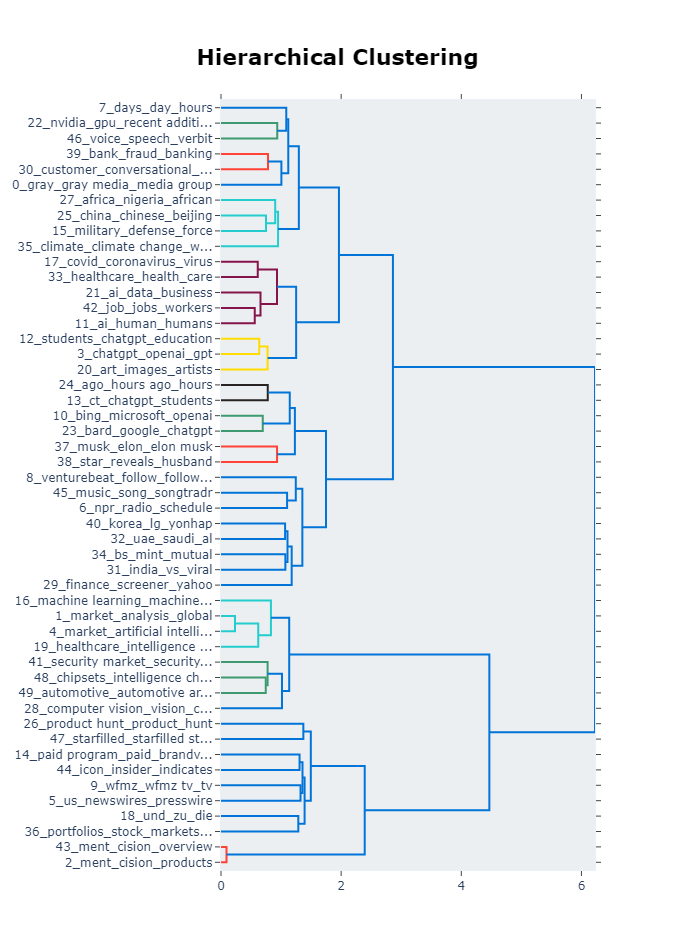

In [ ]:
topic_model.visualize_hierarchy(top_n_topics=50)


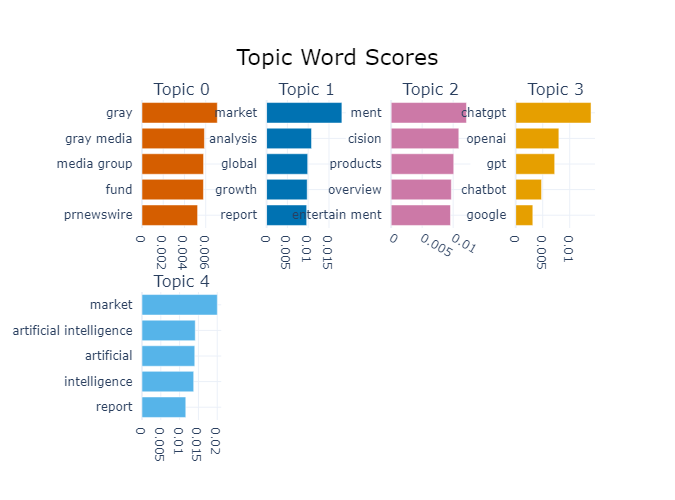

In [ ]:
topic_model.visualize_barchart(top_n_topics=5)

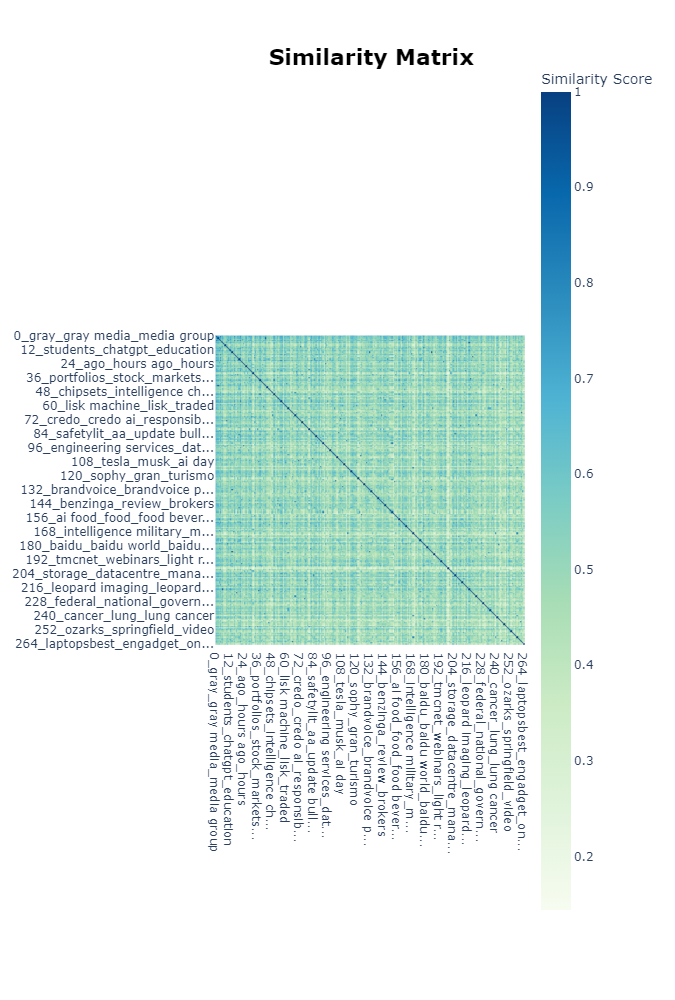

In [ ]:
topic_model.visualize_heatmap(n_clusters=1, width=1000, height=1000)

CPU times: user 19min 15s, sys: 1min 7s, total: 20min 23s
Wall time: 20min 22s


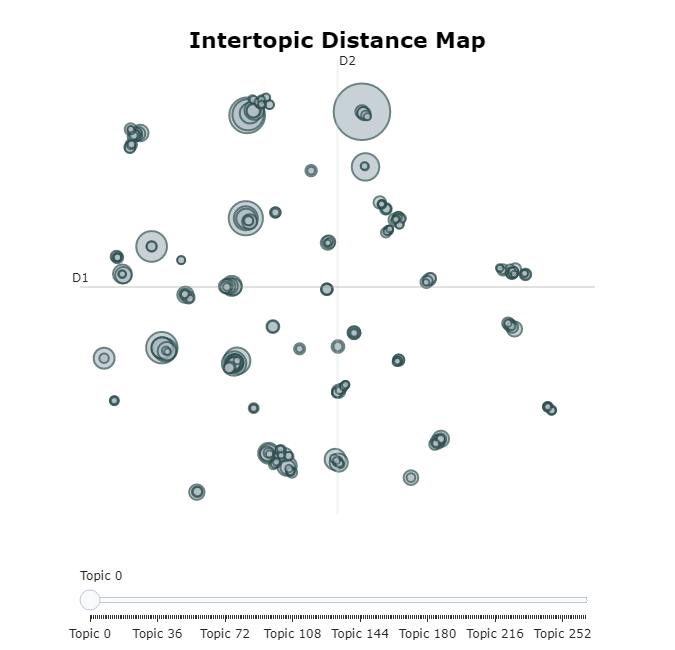

In [178]:
%%time

topic_model.visualize_topics()
#

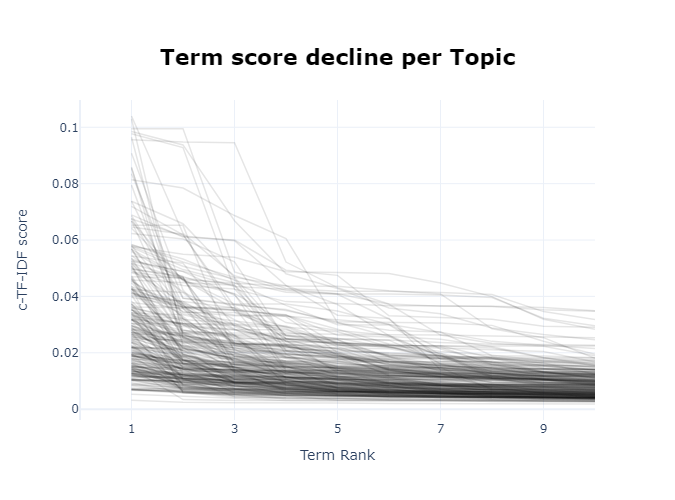

In [ ]:
topic_model.visualize_term_rank()


#### topic reduction - to 200 topics

In [207]:
%%time
new_topics = topic_model.reduce_topics(docs, nr_topics=90)
#topic_mod.reduce_topics(docs, nr_topics = 3) 


2023-05-19 14:35:36,495 - BERTopic - Reduced number of topics from 266 to 37


CPU times: user 8min 59s, sys: 6.26 s, total: 9min 5s
Wall time: 9min 1s


In [208]:
freq = new_topics.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(20)
#xx topics found

Topics found: 37


,Topic,Count,Name
0,-1,68052,-1_ai_news_data_new
1,0,30691,0_us_ai_news_new
2,1,25225,1_market_ai_intelligence_data
3,2,7438,2_ai_days_ago_new
4,3,3130,3_venturebeat_follow_ai_follow us
5,4,3108,4_ai_market_news_retail
6,5,3060,5_starfilled_ai_data_starfilled starfilled
7,6,2651,6_ai_news_ddn_arrow
8,7,2158,7_chatgpt_students_ai_new
9,8,1907,8_drug_market_discovery_edge


In [215]:
new_topics.get_topic(17)  

[('credo', 0.03134197090312124),
 ('credo ai', 0.029289637894103982),
 ('ai', 0.021364997309663143),
 ('space', 0.01223210872399148),
 ('governance', 0.011082271732933127),
 ('responsible ai', 0.01032511197376296),
 ('gatc', 0.008903344752079982),
 ('responsible', 0.008721795149884727),
 ('health', 0.008276982884971964),
 ('nasa', 0.0077473647106864165)]

In [216]:
new_topics.get_topic(3) 

[('venturebeat', 0.01597188872780595),
 ('follow', 0.014127602903932637),
 ('ai', 0.012981971075535325),
 ('follow us', 0.010469748687904267),
 ('data', 0.010306584274660111),
 ('us', 0.010173411915868066),
 ('military', 0.008634568083044592),
 ('intelligence', 0.007597319756642422),
 ('market', 0.0073108331960240955),
 ('share', 0.006798935451960033)]

In [217]:
new_topics.get_topic(14) 

[('automotive', 0.030675455368951512),
 ('market', 0.02592497220755994),
 ('automotive artificial', 0.021189671643562797),
 ('artificial intelligence', 0.01878315727302124),
 ('artificial', 0.018721241311084953),
 ('intelligence', 0.018682329442605117),
 ('argo', 0.017459316139063513),
 ('autonomous', 0.012514170985267381),
 ('report', 0.011301534805286352),
 ('vehicle', 0.010649274380783315)]

In [218]:
new_topics.get_topic(12)  

[('icon', 0.02278914010317371),
 ('musk', 0.02124157090996323),
 ('tesla', 0.0139380790613448),
 ('insider', 0.013328098772487775),
 ('ai', 0.012756757538290059),
 ('indicates', 0.011504085454988409),
 ('elon', 0.010440159853737469),
 ('elon musk', 0.00997111861503895),
 ('arize', 0.008510162294776118),
 ('news', 0.007805877380261475)]

In [219]:
new_topics.get_topic(10)  

[('india', 0.018917263293555153),
 ('news', 0.010147797883290842),
 ('ai', 0.00807539017012378),
 ('vs', 0.007565545891341972),
 ('dh', 0.007293793904058606),
 ('live', 0.00723433961280067),
 ('world', 0.0064906908150264),
 ('day', 0.00614038911634154),
 ('delhi', 0.005938258039939079),
 ('watch', 0.005898813702523529)]

In [220]:
new_topics.get_topic(0)  

[('us', 0.010734809484346389),
 ('ai', 0.010040996436923091),
 ('news', 0.008066518529668791),
 ('new', 0.006582928783344031),
 ('chatgpt', 0.004908856072202207),
 ('intelligence', 0.00490418209487045),
 ('data', 0.004751174246006199),
 ('market', 0.004619518292630521),
 ('artificial', 0.004521241407571895),
 ('technology', 0.004476860592960639)]

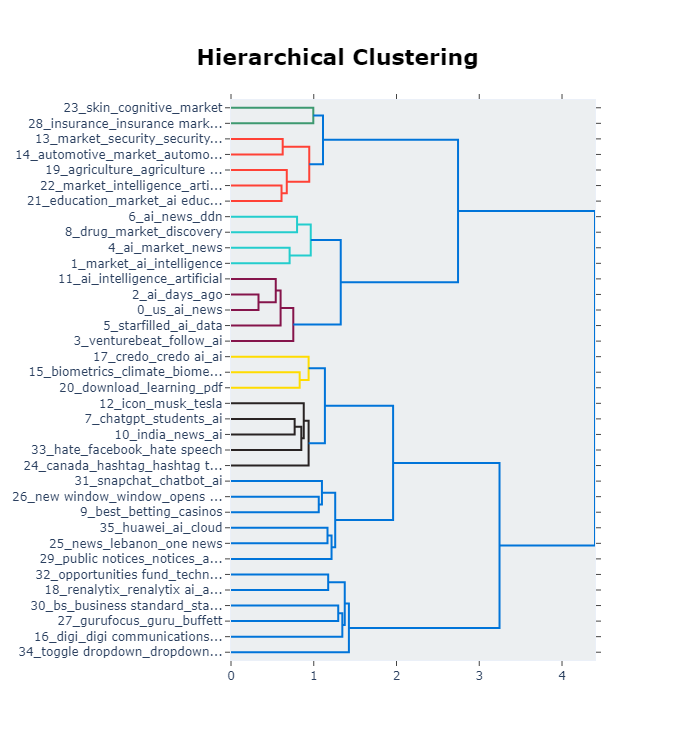

In [210]:
new_topics.visualize_hierarchy(top_n_topics=50)


In [71]:
path_lda = '/home/jupyter'


In [223]:
# Save model - 37 topics
new_topics.save(path_lda +'/lda_model')

# Load model
#saved_model = BERTopic.load(path_lda +'/lda_model')

In [226]:
# Save model - 266 topics
topic_model.save(path_lda +'/lda_model_266')
# Load model
#saved_model = BERTopic.load(path_lda +'/lda_model')

In [279]:
#df_analysis = pd.read_parquet('df_analysis.parquet', engine='pyarrow')
#- seperated from df_analysis into positive and negative
#df_positive = pd.read_parquet('df_positive.parquet', engine='pyarrow')
#df_negative = pd.read_parquet('df_negative.parquet', engine='pyarrow')
#lda_model_266 = topics on 37 topics of general corpus (it is 37 because i probably reduced it)
#lda_model_266 = topics on 37 topics of general corpus


# Entity Extraction on positive news

In [10]:
import spacy 
from spacy import displacy
from spacy.util import minibatch, compounding
from tqdm import tqdm
spacy.prefer_gpu()
#spacy.require_gpu()

print(spacy.__version__)


2023-05-25 18:41:34.839269: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-25 18:41:36.360839: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-25 18:41:36.364336: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-05-

3.5.3


In [7]:
df_positive = pd.read_parquet('df_positive.parquet', engine='pyarrow')


In [8]:
spacy_content_df = pd.read_parquet('content_clean_spacy_final_project.parquet', engine='pyarrow')


In [16]:
spacy_content_df.shape

(162486, 6)

In [11]:
# nlp = spacy.load("en_core_web_sm",exclude=['tok2vec','lemmatizer'])
nlp = spacy.load("en_core_web_lg",exclude=['tok2vec','lemmatizer'])


In [12]:
#add spacy text (not lower cased and unclean) to the negative topics dataframe
df_positive = pd.merge(df_positive, spacy_content_df[["content_clean", "url"]], left_on="url", right_on="url", how="inner")
#df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [13]:
df_positive['date'] = pd.to_datetime(df_positive['date'])


In [19]:
df_positive.shape

(100039, 6)

In [21]:
df_analysis_sample = df_positive

In [22]:
#df_analysis_sample = df_analysis_sample.sample(n=100039)

In [23]:
%%time
# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 23min 25s, sys: 20.2 s, total: 23min 45s
Wall time: 1h 27min 7s


In [24]:
# Example: Accessing the top entities for 'ORG'
top_org_entities_pos = df_entities_by_label['ORG']
top_person_entities_pos = df_entities_by_label['PERSON']
top_product_entities_pos = df_entities_by_label['PRODUCT']


In [66]:
top_org_entities_pos.head(5)

,2020,2021,2022,2023
AI,21384.0,31597.0,44393.0,40222.0
Artificial Intelligence,14745.0,14808.0,6118.0,3192.0
Google,11417.0,11160.0,9813.0,29527.0
Microsoft,10188.0,10408.0,5031.0,31330.0
IBM,9972.0,10224.0,6448.0,1312.0


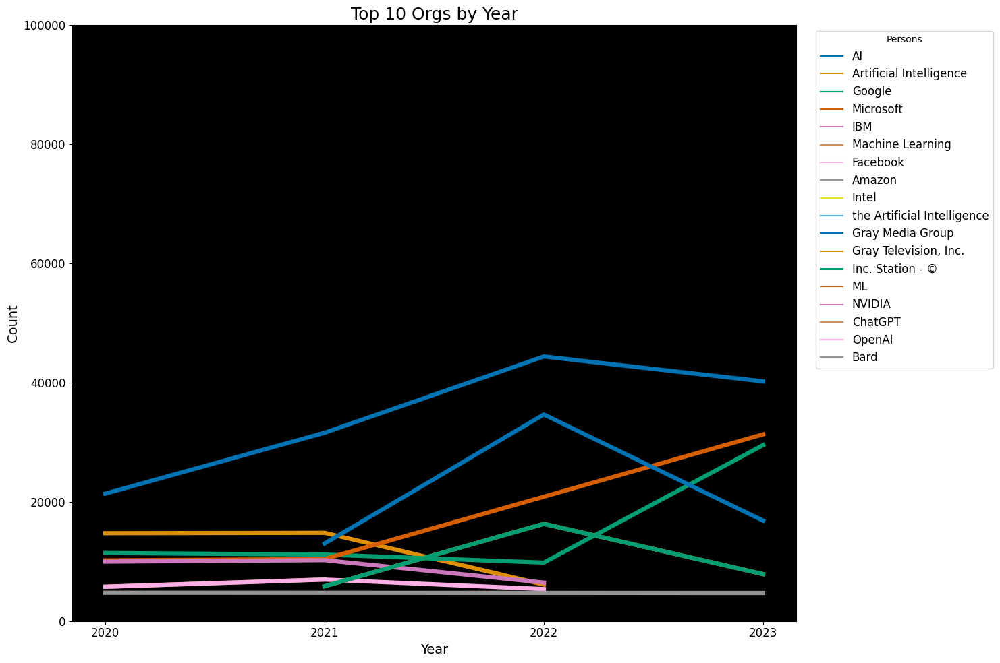

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Reset the index of the DataFrame so 'year' becomes a column
top_person_entities_neg_reset = top_org_entities_pos.reset_index()

# Rename the columns for clarification
top_person_entities_neg_reset = top_person_entities_neg_reset.rename(columns={'index': 'Entity'})

# Melt the DataFrame to make it suitable for plotting
df_melted = top_person_entities_neg_reset.melt(id_vars='Entity', var_name='Year', value_name='Count')

# Ensure 'Year' is integer for plotting
df_melted['Year'] = df_melted['Year'].astype(int)

# Select the top 10 entities for each year based on count
top_10_each_year = df_melted.groupby('Year').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

# Define a custom color palette for better differentiation of lines
custom_palette = sns.color_palette("colorblind", n_colors=len(top_10_each_year['Entity'].unique()))

# Create line plot with seaborn and custom palette
plt.figure(figsize=(15, 10))
sns.lineplot(data=top_10_each_year, x='Year', y='Count', hue='Entity', palette=custom_palette, linewidth=4.5)

# Set plot title and labels
plt.title('Top 10 Orgs by Year', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Persons', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

# Set y-axis limit
plt.ylim(0, 100000)

# Customize ticks and tick labels
plt.xticks([2020, 2021, 2022, 2023], fontsize=12)
plt.yticks(fontsize=12)

# Remove the right and top spines
plt.gca().spines['right'].set_visible(True)
plt.gca().spines['top'].set_visible(True)

# Adjust legend location
plt.legend(title='Persons', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=12)
# Set the style and context using Seaborn
sns.set_style("darkgrid")
sns.set_context("notebook")

# Set background color
plt.gca().set_facecolor('#000000')

plt.tight_layout()
plt.show()


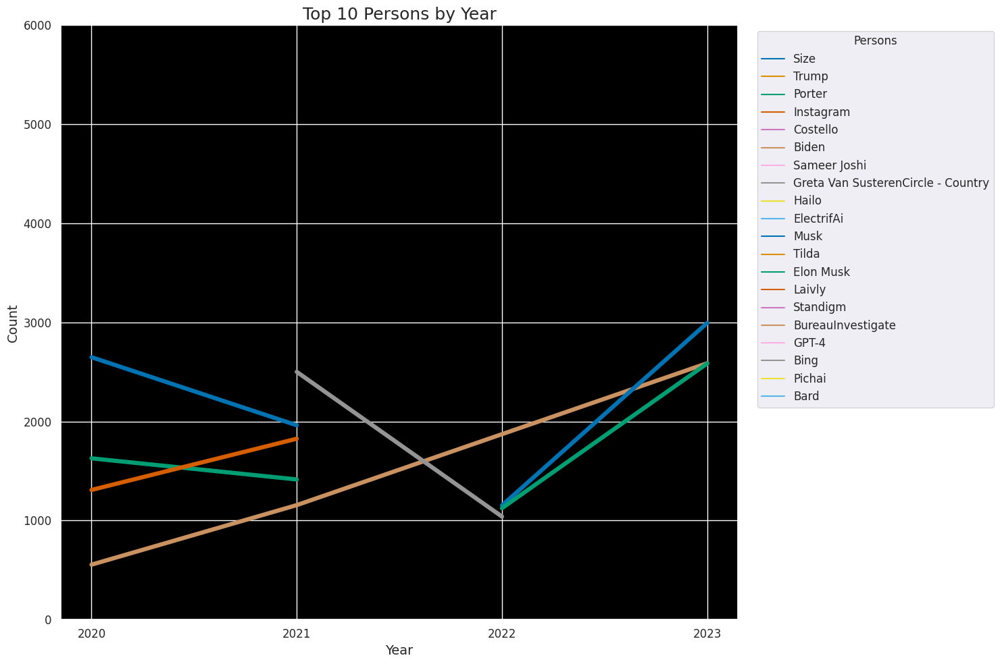

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Reset the index of the DataFrame so 'year' becomes a column
top_person_entities_neg_reset = top_person_entities_pos.reset_index()

# Rename the columns for clarification
top_person_entities_neg_reset = top_person_entities_neg_reset.rename(columns={'index': 'Entity'})

# Melt the DataFrame to make it suitable for plotting
df_melted = top_person_entities_neg_reset.melt(id_vars='Entity', var_name='Year', value_name='Count')

# Ensure 'Year' is integer for plotting
df_melted['Year'] = df_melted['Year'].astype(int)

# Select the top 10 entities for each year based on count
top_10_each_year = df_melted.groupby('Year').apply(lambda x: x.nlargest(7, 'Count')).reset_index(drop=True)

# Define a custom color palette for better differentiation of lines
custom_palette = sns.color_palette("colorblind", n_colors=len(top_10_each_year['Entity'].unique()))

# Create line plot with seaborn and custom palette
plt.figure(figsize=(15, 10))
sns.lineplot(data=top_10_each_year, x='Year', y='Count', hue='Entity', palette=custom_palette, linewidth=4.5)

# Set plot title and labels
plt.title('Top 10 Persons by Year', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Persons', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

# Set y-axis limit
plt.ylim(0, 6000)

# Customize ticks and tick labels
plt.xticks([2020, 2021, 2022, 2023], fontsize=12)
plt.yticks(fontsize=12)

# Remove the right and top spines
plt.gca().spines['right'].set_visible(True)
plt.gca().spines['top'].set_visible(True)

# Adjust legend location
plt.legend(title='Persons', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=12)
# Set the style and context using Seaborn
sns.set_style("darkgrid")
sns.set_context("notebook")

# Set background color
plt.gca().set_facecolor('#000000')

plt.tight_layout()
plt.show()


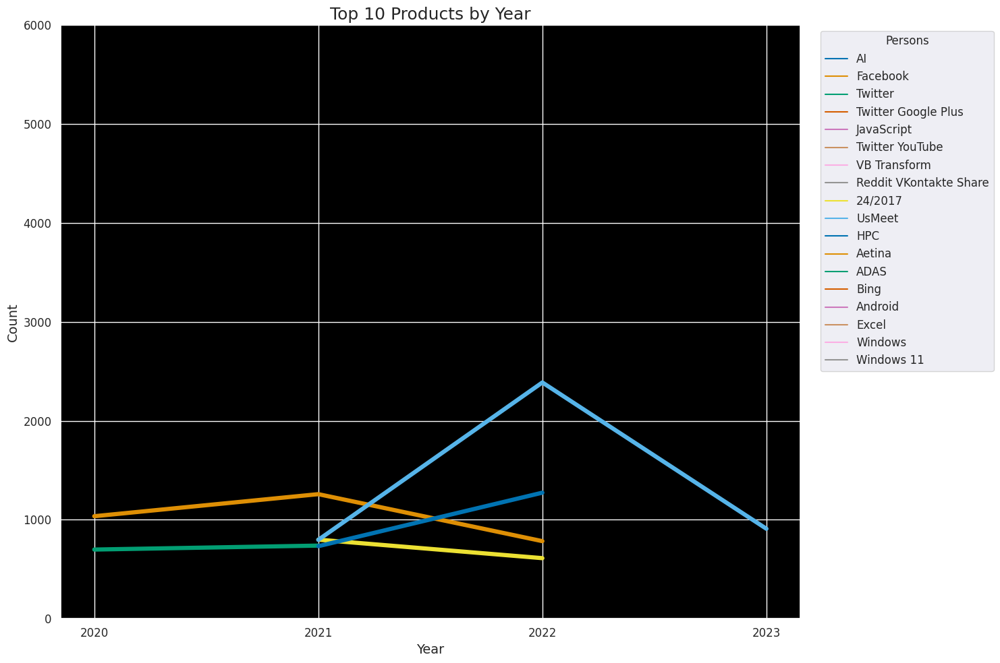

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Reset the index of the DataFrame so 'year' becomes a column
top_person_entities_neg_reset = top_product_entities_pos.reset_index()

# Rename the columns for clarification
top_person_entities_neg_reset = top_person_entities_neg_reset.rename(columns={'index': 'Entity'})

# Melt the DataFrame to make it suitable for plotting
df_melted = top_person_entities_neg_reset.melt(id_vars='Entity', var_name='Year', value_name='Count')

# Ensure 'Year' is integer for plotting
df_melted['Year'] = df_melted['Year'].astype(int)

# Select the top 10 entities for each year based on count
top_10_each_year = df_melted.groupby('Year').apply(lambda x: x.nlargest(7, 'Count')).reset_index(drop=True)

# Define a custom color palette for better differentiation of lines
custom_palette = sns.color_palette("colorblind", n_colors=len(top_10_each_year['Entity'].unique()))

# Create line plot with seaborn and custom palette
plt.figure(figsize=(15, 10))
sns.lineplot(data=top_10_each_year, x='Year', y='Count', hue='Entity', palette=custom_palette, linewidth=4.5)

# Set plot title and labels
plt.title('Top 10 Products by Year', fontsize=18)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Persons', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)

# Set y-axis limit
plt.ylim(0, 6000)

# Customize ticks and tick labels
plt.xticks([2020, 2021, 2022, 2023], fontsize=12)
plt.yticks(fontsize=12)

# Remove the right and top spines
plt.gca().spines['right'].set_visible(True)
plt.gca().spines['top'].set_visible(True)

# Adjust legend location
plt.legend(title='Persons', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=12)
# Set the style and context using Seaborn
sns.set_style("darkgrid")
sns.set_context("notebook")

# Set background color
plt.gca().set_facecolor('#000000')

plt.tight_layout()
plt.show()


In [31]:
# top_org_entities_pos.columns = ['2020', '2021', '2022', '2023']
# top_person_entities_pos.columns = ['2020', '2021', '2022', '2023']
# top_product_entities_pos.columns = ['2020', '2021', '2022', '2023']


In [30]:
# top_org_entities_pos.to_parquet('top_org_entities_pos.parquet', engine='pyarrow')

In [32]:
# top_person_entities_pos.to_parquet('top_person_entities_pos.parquet', engine='pyarrow')
# top_product_entities_pos.to_parquet('top_product_entities_pos.parquet', engine='pyarrow')

# Bertopics on positive sentiment news 

In [169]:
#removing neutrals
df_analysis = df_analysis[df_analysis['roberta_latest_title_sentiment'] != 'LABEL_1']


In [192]:
df_analysis.to_parquet('df_analysis.parquet', engine='pyarrow')


In [175]:
df_positive = df_analysis[df_analysis['roberta_latest_title_sentiment'] == 'LABEL_2']


In [4]:
#df_positive.to_parquet('df_positive.parquet', engine='pyarrow')


In [6]:
df_positive.shape

(100996, 5)

In [80]:
%%time
docs = df_positive['cleaned_text'].tolist()


CPU times: user 105 ms, sys: 369 ms, total: 475 ms
Wall time: 469 ms


In [231]:
%%time

topic_model_positive = BERTopic(language="english", min_topic_size=30, n_gram_range=(1,2), calculate_probabilities=False, verbose=True)
topics, probs = topic_model_positive.fit_transform(docs)

Batches:   0%|          | 0/3157 [00:00<?, ?it/s]

2023-05-19 15:37:45,889 - BERTopic - Transformed documents to Embeddings
2023-05-19 15:38:59,421 - BERTopic - Reduced dimensionality
2023-05-19 15:39:07,756 - BERTopic - Clustered reduced embeddings


CPU times: user 46min 52s, sys: 5min 55s, total: 52min 47s
Wall time: 20min 39s


In [114]:
%%time
#running again because after reduction to 50 topics even after changing variable name you cannot access previous variable

topic_model_positive = BERTopic(language="english", min_topic_size=30, n_gram_range=(1,2), calculate_probabilities=False, verbose=True)
topics, probs = topic_model_positive.fit_transform(docs)

Batches:   0%|          | 0/3127 [00:00<?, ?it/s]

2023-05-26 06:31:38,542 - BERTopic - Transformed documents to Embeddings
2023-05-26 06:32:47,132 - BERTopic - Reduced dimensionality
2023-05-26 06:32:56,026 - BERTopic - Clustered reduced embeddings


CPU times: user 44min 13s, sys: 6min 37s, total: 50min 50s
Wall time: 21min 39s


In [115]:
#checking with below because it was rerun
freq = topic_model_positive.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(20)
#xx topics found

Topics found: 754


,Topic,Count,Name
0,-1,29299,-1_us_ai_news_new
1,0,2280,0_market_analysis_players_growth
2,1,1975,1_ment_cision_entertain ment_entertain
3,2,1044,2_laivly_gray_gray media_media group
4,3,907,3_market_intelligence software_artificial intelligence_artificial
5,4,810,4_learning market_machine learning_machine_learning
6,5,803,5_wfmz_wfmz tv_lehigh_berks
7,6,778,6_und_zu_die_hoc
8,7,758,7_chatgpt_gpt_openai_chatbot
9,8,713,8_days_software days_technology days_may also


In [263]:
topic_model_positive.get_topic(0)  # Select the most frequent topic

[('market', 0.006351688447625568),
 ('analysis', 0.004923013611003048),
 ('players', 0.0047061695399391165),
 ('growth', 0.004649534207824899),
 ('report', 0.004449352784590002),
 ('global', 0.004313027856453599),
 ('forecast', 0.004172499522282458),
 ('key', 0.004056633436015475),
 ('corporation', 0.003824824104588242),
 ('trends', 0.0037736808075665936)]

#### Visualize Topic Hierarchy

#### The topics that were created can be hierarchically reduced. In order to understand the potential hierarchical structure of the topics, we can use scipy.cluster.hierarchy to create clusters and visualize how they relate to one another. This might help selecting an appropriate nr_topics when reducing the number of topics that you have created.

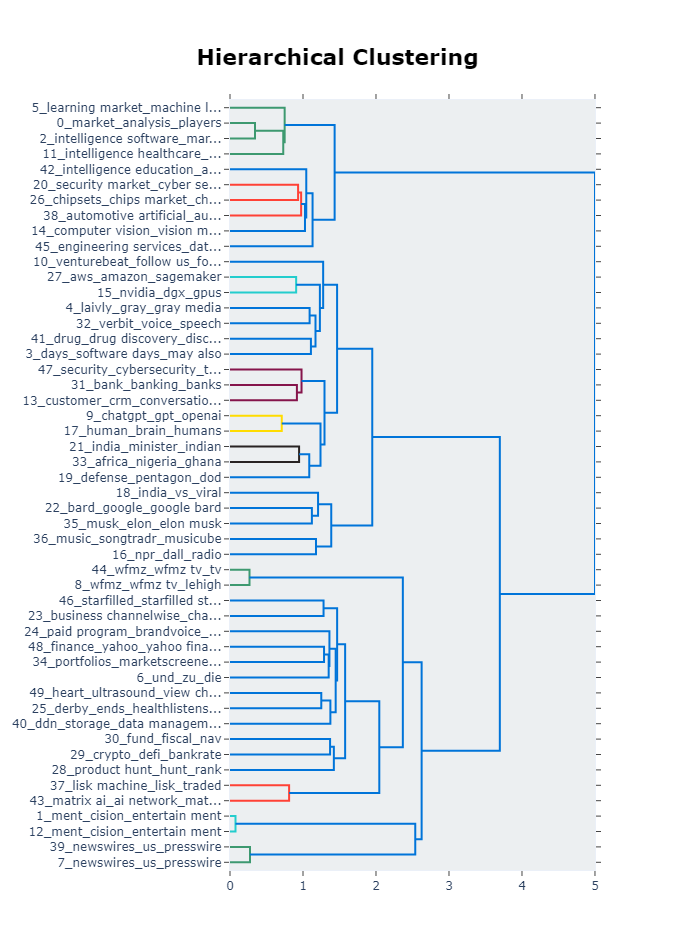

In [264]:
topic_model_positive.visualize_hierarchy(top_n_topics=50)


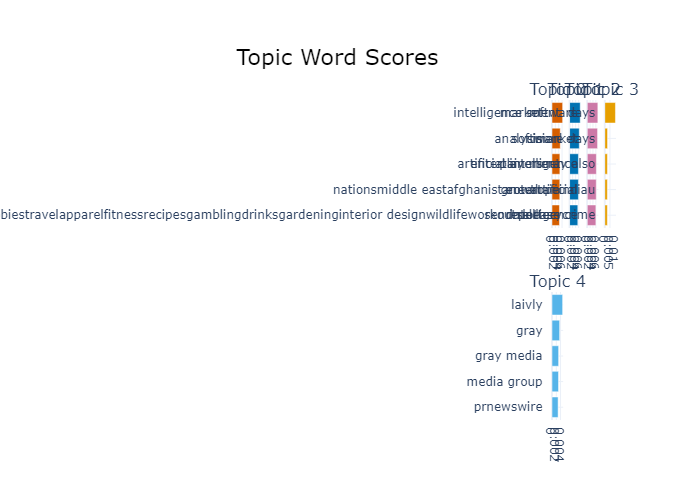

In [265]:
topic_model_positive.visualize_barchart(top_n_topics=5)

#### topic reduction (to 310 topics)

In [266]:
new_topics_positive = topic_model_positive.reduce_topics(docs, nr_topics=310)
#topic_mod.reduce_topics(docs, nr_topics = 3) 


2023-05-19 17:31:42,009 - BERTopic - Reduced number of topics from 755 to 310


In [87]:
freq = new_topics_positive.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
#freq.head(200)
#xx topics found
# Set the display options to show more rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the dataframe
# freq.head(200)


Topics found: 310


In [284]:
# Save model - 310 topics_positive
new_topics_positive.save(path_lda +'/lda_model_positive_310')
# Load model
#saved_model = BERTopic.load(path_lda +'/lda_model')

In [ ]:
#leverage this below is key for this topic search 
#topic_model.get_document_info(docs)


In [289]:
df_topics_positive = new_topics_positive.get_document_info(docs)


In [291]:
#removing outliers
df_topics_positive = df_topics_positive[df_topics_positive['Topic'] != -1]


In [290]:
df_topics_positive["Representative_document"].value_counts()
#after removing -1 (outliers)

False    100045
True        951
Name: Representative_document, dtype: int64

In [302]:
#df_topics_positive.to_parquet('df_topics_positive.parquet', engine='pyarrow')

# Reloading Dataframe and LDA Model

In [72]:
new_topics_positive = BERTopic.load(path_lda +'/lda_model_positive_310')

In [89]:
path_lda

'/home/jupyter'

In [73]:
df_topics_positive = pd.read_parquet('df_topics_positive.parquet', engine='pyarrow')


In [75]:
topic_counts = df_topics_positive['Topic'].value_counts()
print(topic_counts)


0      3799
1      3414
2      2833
3      1700
4      1688
       ... 
303      31
306      31
305      31
307      30
308      30
Name: Topic, Length: 309, dtype: int64


#### topic search - Chat GPT

In [ ]:
similar_topics, similarity = new_topics_positive.find_topics("chat gpt", top_n=10); similar_topics

[6, 237, 184, 29, 58, 198, 59, 122, 2, 91]

In [13]:
similar_topics, similarity = new_topics_positive.find_topics("chatgpt", top_n=10); similar_topics

[6, 237, 29, 184, 26, 302, 58, 122, 62, 91]

In [14]:
similar_topics, similarity = new_topics_positive.find_topics("gpt", top_n=10); similar_topics

[6, 237, 198, 58, 59, 122, 12, 2, 90, 141]

In [15]:
#chatgpt
selected_topics = [6, 237, 184, 29, 58, 198, 59, 122, 2, 91]
chatgpt_df = df_topics_positive[df_topics_positive['Topic'].isin(selected_topics)]


In [76]:
# chatgpt_df.head(1)

In [77]:
# chatgpt_df.shape

In [30]:
from collections import Counter

# Initialize empty lists to store counts
positive_counts = []
negative_counts = []

# Loop through each document
for index, row in chatgpt_df.iterrows():
    positive_sentences = row['Positive_Sentences']
    negative_sentences = row['Negative_Sentences']
    
    # Count the number of positive and negative sentences
    positive_count = len(positive_sentences)
    negative_count = len(negative_sentences)
    
    # Append the counts to the respective lists
    positive_counts.append(positive_count)
    negative_counts.append(negative_count)

# Add the counts as separate columns in the DataFrame
chatgpt_df['Positive_Sentence_Count'] = positive_counts
chatgpt_df['Negative_Sentence_Count'] = negative_counts


In [108]:
from nltk.sentiment import SentimentIntensityAnalyzer

# Initialize the sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Function to perform aspect-based sentiment analysis
def perform_aspect_sentiment_analysis(text):
    # Tokenize the text into sentences
    sentences = nltk.sent_tokenize(text)
    
    # Analyze sentiment for each sentence
    sentiment_scores = []
    for sentence in sentences:
        sentiment = sia.polarity_scores(sentence)
        sentiment_scores.append(sentiment['compound'])
    
    # Return the average sentiment score for the text
    return sum(sentiment_scores) / len(sentiment_scores)

# Apply aspect-based sentiment analysis to the 'text' column of your DataFrame
chatgpt_df_1['aspect_sentiment'] = chatgpt_df_1['Document'].apply(perform_aspect_sentiment_analysis)


In [334]:
import pandas as pd
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to perform targeted sentiment analysis
def perform_targeted_sentiment_analysis(row, target_entity):
    text = row['Document']
    sentiment_scores = analyzer.polarity_scores(text)
    compound_score = sentiment_scores['compound']
    
    # Check if the target entity is mentioned in the text
    if target_entity.lower() in text.lower():
        if compound_score >= 0.05:
            sentiment = 'positive'
        elif compound_score <= -0.05:
            sentiment = 'negative'
        else:
            sentiment = 'neutral'
        return sentiment
    else:
        return 'not mentioned'

# Example target entity
target_entity = "innovation"

# Perform targeted sentiment analysis on the chatgpt_df dataframe
chatgpt_df['Sentiment_innovation'] = chatgpt_df.apply(perform_targeted_sentiment_analysis, target_entity=target_entity, axis=1)

# Interpret the sentiment analysis results
sentiment_counts = chatgpt_df['Sentiment_innovation'].value_counts()
positive_count = sentiment_counts.get('positive', 0)
negative_count = sentiment_counts.get('negative', 0)
neutral_count = sentiment_counts.get('neutral', 0)

# Calculate the percentage of positive, negative, and neutral sentiment
total_count = len(chatgpt_df)
positive_percentage = (positive_count / total_count) * 100
negative_percentage = (negative_count / total_count) * 100
neutral_percentage = (neutral_count / total_count) * 100

# Interpretation of sentiment analysis results
interpretation = f"In the {total_count} analyzed documents, the sentiment towards {target_entity} is as follows:\n"
interpretation += f"Positive: {positive_count} documents ({positive_percentage:.2f}%)\n"
interpretation += f"Negative: {negative_count} documents ({negative_percentage:.2f}%)\n"
interpretation += f"Neutral: {neutral_count} documents ({neutral_percentage:.2f}%)"

# Print the interpretation
print(interpretation)


In the 5882 analyzed documents, the sentiment towards innovation is as follows:
Positive: 1681 documents (28.58%)
Negative: 11 documents (0.19%)
Neutral: 0 documents (0.00%)


#### reduction to 100 topics (50 was too less because 45000 articles was in top 1)

In [116]:
new_topics_positive_50 = topic_model_positive.reduce_topics(docs, nr_topics=100)
#topic_mod.reduce_topics(docs, nr_topics = 3) 


2023-05-26 06:46:50,166 - BERTopic - Reduced number of topics from 754 to 100


In [310]:
df_topics_positives_100 = new_topics_positive_50.get_document_info(docs)


In [311]:
df_topics_positives_100.to_parquet('df_topics_positives_100.parquet', engine='pyarrow')

In [301]:
freq = new_topics_positive_50.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
#freq.head(200)
#xx topics found
# Set the display options to show more rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Print the dataframe
freq.head(100)

#topic 2 - chatgpt
#topic 4 - healthcare (topic 19 - drug discovery)(topic 24 - covid coronavirus)
#topic 5 - computer vision
#topic 7 - automative / tesla
#topic 8 - nvidia
#topic 9 - military intelligence aviation defense
#topic 11 - intelligence education
#topic 15 - cybersecurity
#topic 21 - retail fashion
#topic 22 - iot
#topic 28 - agriculture
#topic 31 - energy intelligence
#topic 32 - food intellgience ai
#topic 33 - legal tech
#topic 34 - dentists
#topic 38 - conversational ai
#topic 41 - quantum computing
#topic 58 - insurance
#topic 71 - oil

Topics found: 100


,Topic,Count,Name
0,-1,29299,-1_ai_us_news_market
1,0,21208,0_market_ai_data_services
2,1,7820,1_us_news_tv_ai
3,2,5350,2_chatgpt_microsoft_google_news
4,3,4961,3_paid_paid program_fund_brandvoice
5,4,3366,4_healthcare_medical_health_market
6,5,2189,5_vision_computer vision_computer_market
7,6,1836,6_market_intelligence_artificial intelligence_artificial
8,7,1532,7_automotive_musk_tesla_automotive artificial
9,8,1297,8_nvidia_gpu_ai_hpc


#### reduction to 50 topics 

In [106]:
# new_topics_positive_50 = topic_model_positive.reduce_topics(docs, nr_topics=50)
# #topic_mod.reduce_topics(docs, nr_topics = 3) 


2023-05-26 05:57:59,732 - BERTopic - Reduced number of topics from 100 to 50


In [107]:
# df_topics_positives_50 = new_topics_positive_50.get_document_info(docs)
# df_topics_positives_50.to_parquet('df_topics_positives_50.parquet', engine='pyarrow')

In [111]:
# freq = new_topics_positive_50.get_topic_info()

# print(f"Topics found: {freq.shape[0]}")
# #freq.head(200)
# #xx topics found
# # Set the display options to show more rows and columns
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)

# # Print the dataframe
# # freq.head(50)


Topics found: 50


#### 100 topics visualization

CPU times: user 1.87 s, sys: 153 ms, total: 2.02 s
Wall time: 2.13 s


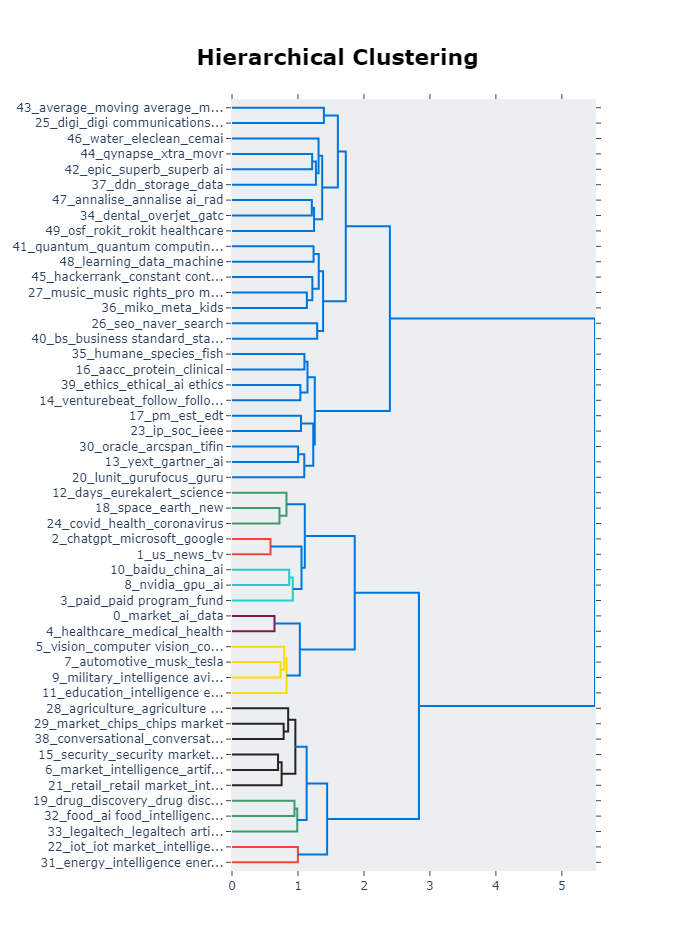

In [121]:
%%time

new_topics_positive_50.visualize_hierarchy(top_n_topics=50)

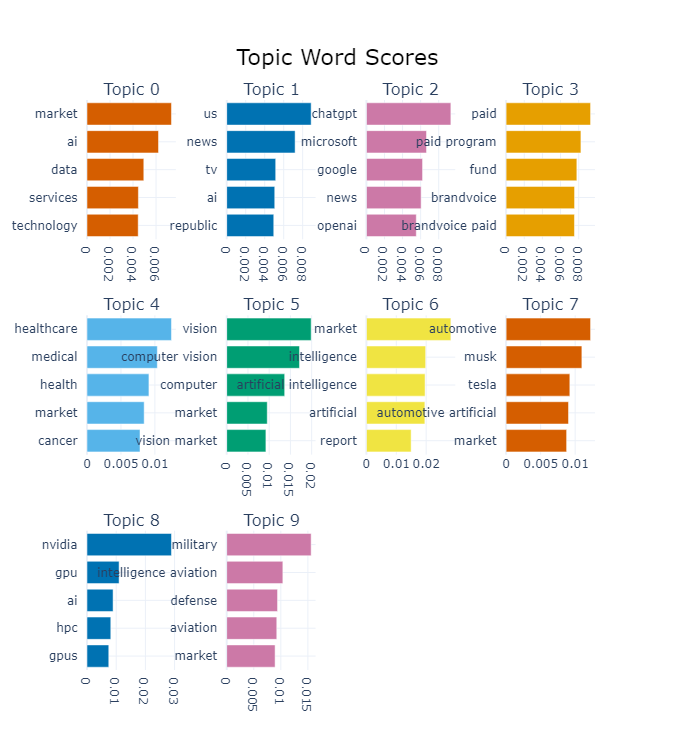

In [122]:
new_topics_positive_50.visualize_barchart(top_n_topics=10)

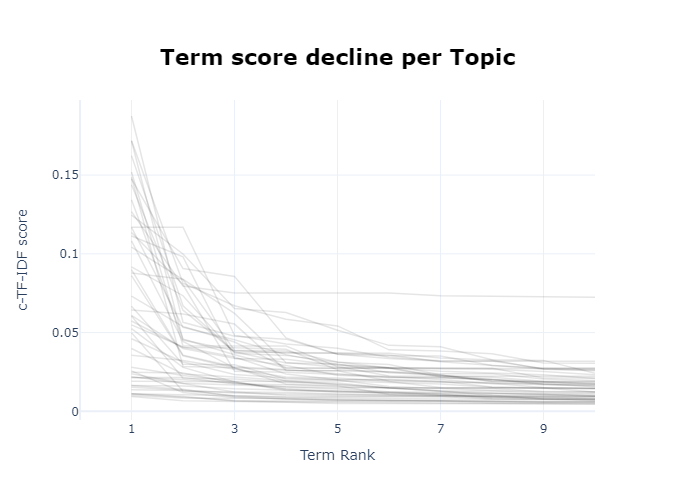

In [110]:
new_topics_positive_50.visualize_term_rank()

# 100 topics Analysis

In [123]:
#df_topics_positives_100.head(1)

In [312]:
#removing outliers
df_topics_positives_100 = df_topics_positives_100[df_topics_positives_100['Topic'] != -1]


In [313]:
df_topics_negative = df_topics_positives_100
#because im copying code from the negative_sentiment_analysis
#will change back the variable name later

In [314]:
#add date to the negative topics dataframe
df_topics_negative = pd.merge(df_topics_negative, df_positive[["cleaned_text", "date"]], left_on="Document", right_on="cleaned_text", how="inner")
df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [315]:
#add url to the negative topics dataframe

df_topics_negative = pd.merge(df_topics_negative, df_positive[["cleaned_text", "url"]], left_on="Document", right_on="cleaned_text", how="inner")
df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [316]:
spacy_content_df = pd.read_parquet('content_clean_spacy_final_project.parquet', engine='pyarrow')


In [317]:
#add spacy text (not lower cased and unclean) to the negative topics dataframe
df_topics_negative = pd.merge(df_topics_negative, spacy_content_df[["content_clean", "url"]], left_on="url", right_on="url", how="inner")
#df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [318]:
#add title (cleaned) to the negative topics dataframe
df_topics_negative = pd.merge(df_topics_negative, df_positive[["clean_title", "cleaned_text"]], left_on="Document", right_on="cleaned_text", how="inner")
df_topics_negative.drop("cleaned_text", axis=1, inplace=True)


In [319]:
df_topics_negative.shape
#the merges must have messed up a little bit - shape is different from before adding all the columns

(90374, 10)

In [320]:
df_topics_positive = df_topics_negative

In [321]:
df_topics_positive.to_parquet('df_topics_positive_100_v3.parquet', engine='pyarrow')

# Checkpoint Read in Parquet File (100 Topics)

In [118]:
# df_topics_positive = pd.read_parquet('df_topics_positive_100_v3.parquet', engine='pyarrow')


# Targeted Entity Extraction on Targeted topics within the 100 positive topics 

#### topic search - Chat GPT

In [322]:
selected_topics = [2]
chatgpt_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [323]:
chatgpt_filtered = chatgpt_df[chatgpt_df['Probability'] > 0.99]

# Count the number of rows satisfying the condition
count = chatgpt_filtered.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

2495

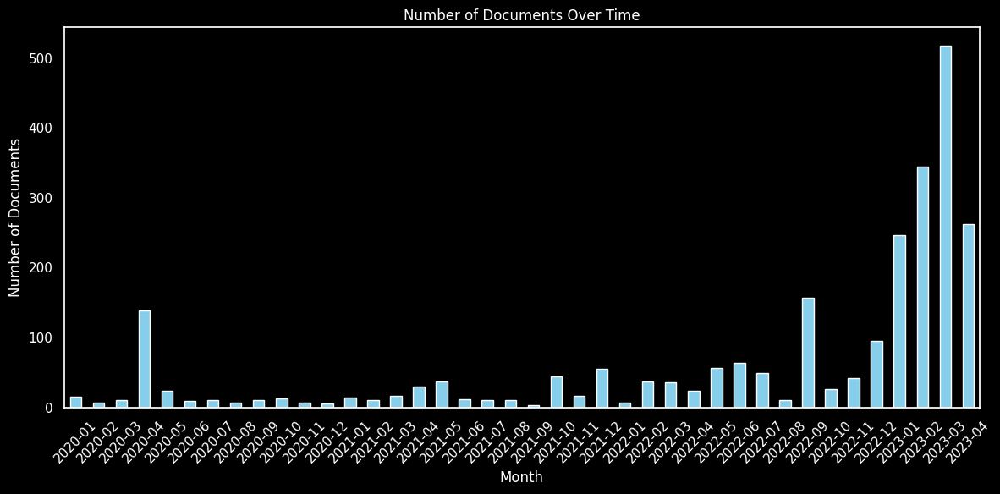

In [324]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [141]:
df_analysis_sample = chatgpt_filtered

In [ ]:
%%time

df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


In [ ]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


In [ ]:
from wordcloud import WordCloud

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


In [ ]:
df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


In [ ]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 4 healthcare

In [163]:
selected_topics = [3]
healthcare_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [165]:
healthcare_df_filtered = healthcare_df[healthcare_df['Probability'] > 0.99]

# Count the number of rows satisfying the condition
count = healthcare_df_filtered.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

1469

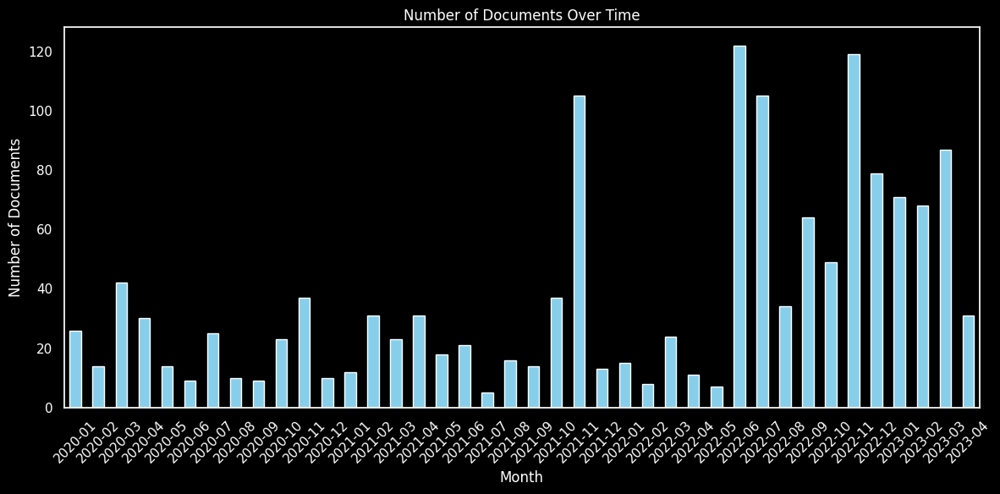

In [166]:
import matplotlib.pyplot as plt

healthcare_df_filtered['date'] = pd.to_datetime(healthcare_df_filtered['date'])

# Extract the month and year from the 'date' column
healthcare_df_filtered['month_year'] = healthcare_df_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = healthcare_df_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [168]:
# #EU proposed ban to use of AI
# healthcare_df_filtered_022021 = healthcare_df_filtered[healthcare_df_filtered['month_year'] == '2022-10']
# healthcare_df_filtered_022021.head(2)

In [169]:
df_analysis_sample = healthcare_df_filtered

In [170]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 579 ms, sys: 41.4 s, total: 41.9 s
Wall time: 1min 13s


In [171]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


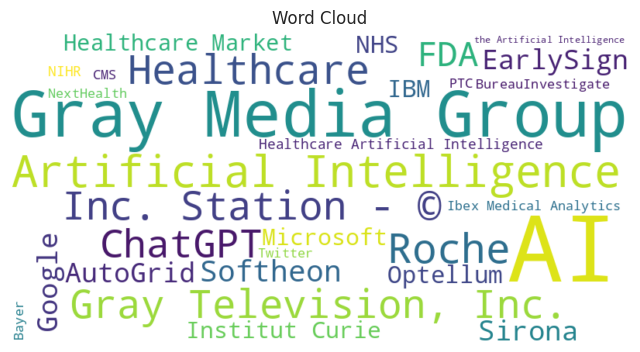

In [172]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


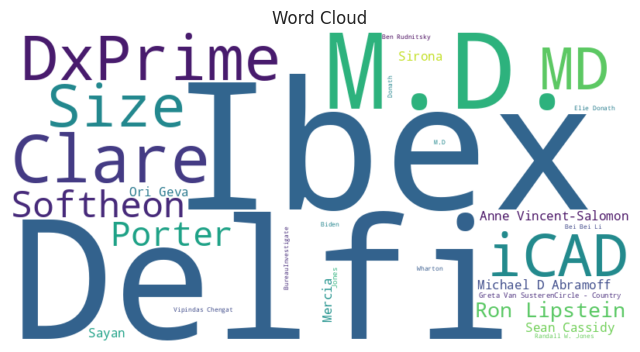

In [173]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


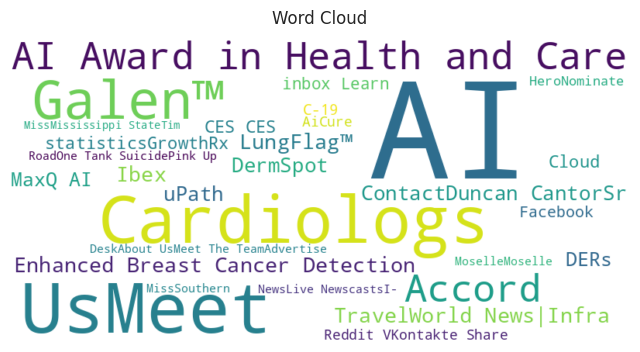

In [174]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 7 - automotive tesla

In [175]:
selected_topics = [7]
tesla_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [176]:
tesla_df_filtered = tesla_df[tesla_df['Probability'] > 0.99]

# Count the number of rows satisfying the condition
count = tesla_df_filtered.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

440

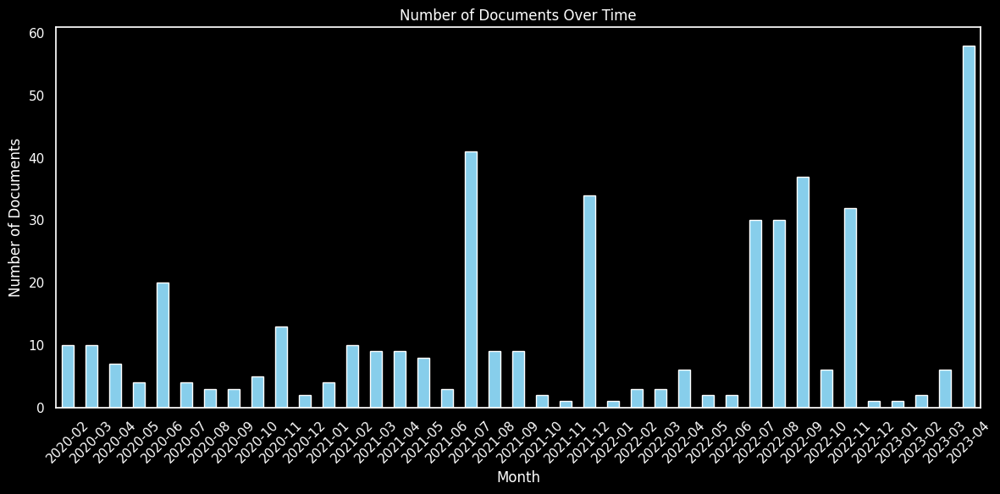

In [178]:
import matplotlib.pyplot as plt

tesla_df_filtered['date'] = pd.to_datetime(tesla_df_filtered['date'])

# Extract the month and year from the 'date' column
tesla_df_filtered['month_year'] = tesla_df_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = tesla_df_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [180]:
df_analysis_sample = tesla_df_filtered

In [181]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 236 ms, sys: 39.5 s, total: 39.7 s
Wall time: 45.7 s


In [182]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


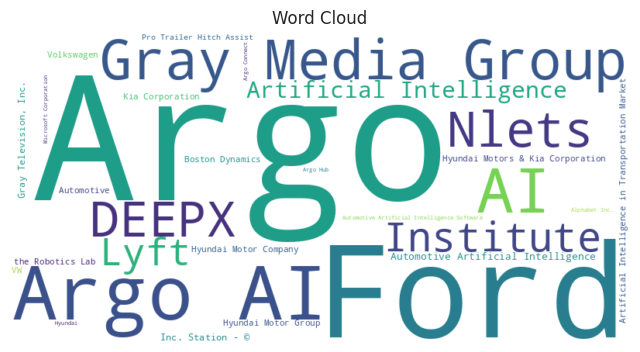

In [183]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


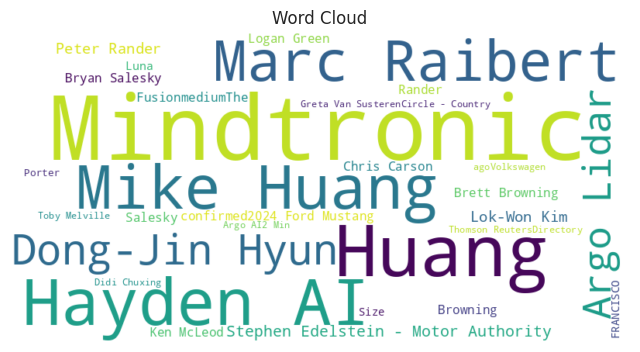

In [184]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


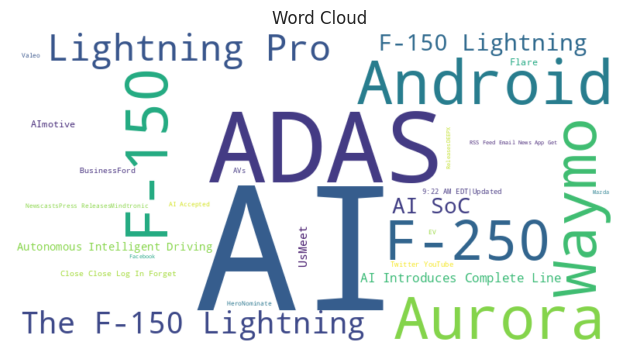

In [185]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 9 military

In [192]:
selected_topics = [9]
military_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [188]:
military_df.shape

(1004, 10)

In [193]:
military_df_filtered = military_df[military_df['Probability'] > 0.5]

# Count the number of rows satisfying the condition
count = military_df_filtered.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

842

In [194]:
chatgpt_filtered = military_df_filtered

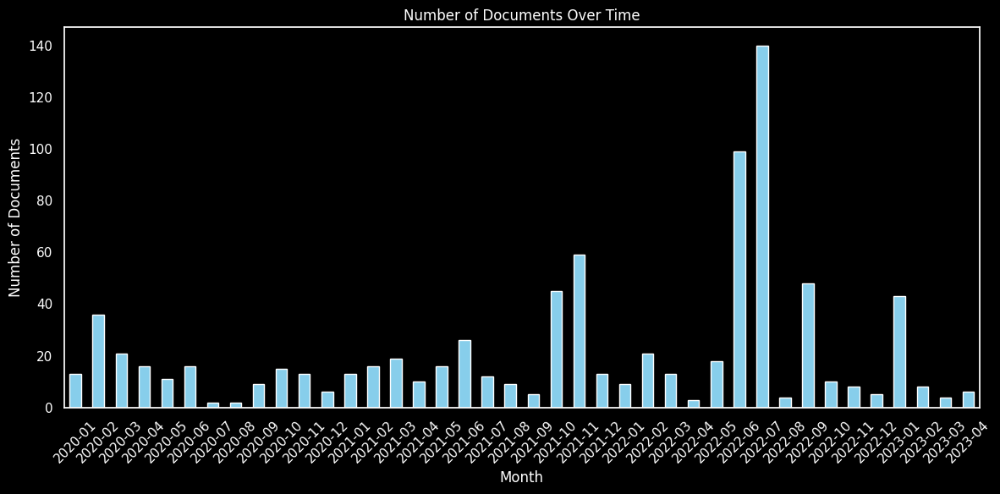

In [195]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [196]:
df_analysis_sample = military_df_filtered

In [197]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 390 ms, sys: 40 s, total: 40.4 s
Wall time: 57.1 s


In [198]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


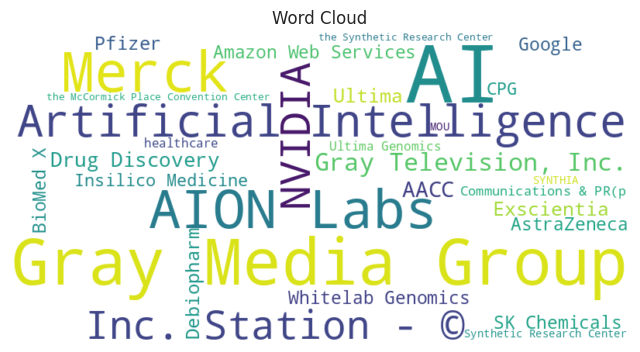

In [199]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


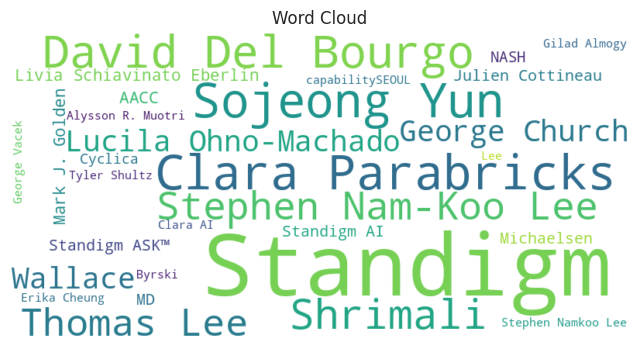

In [200]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


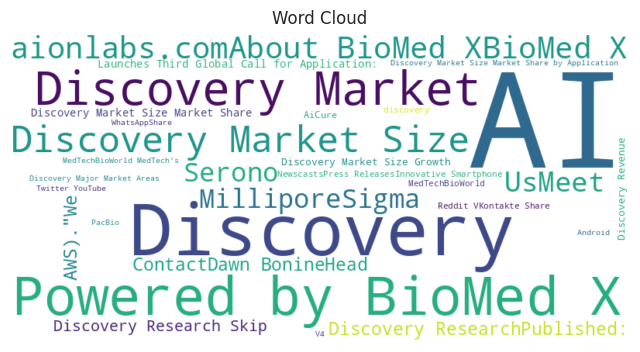

In [201]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 11 - intelligence education

In [202]:
selected_topics = [11]
edu_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [204]:
edu_df.shape

(1080, 10)

In [206]:
edu_df_filtered = edu_df[edu_df['Probability'] > 0.7]

# Count the number of rows satisfying the condition
count = edu_df_filtered.shape[0]
count

#1326 topics chosen from 3209 to plot as most representative according to probability method of Bertopics

585

In [207]:
chatgpt_filtered = edu_df_filtered 

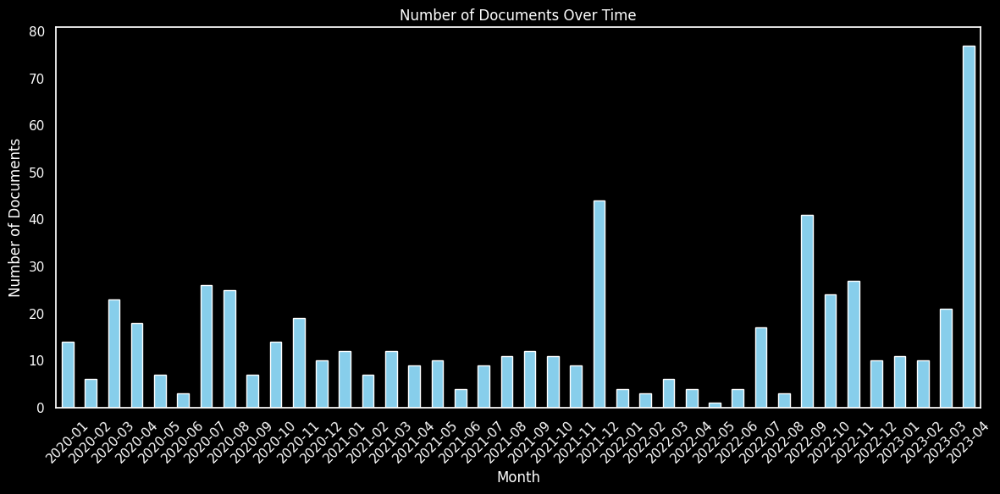

In [208]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [209]:
df_analysis_sample = chatgpt_filtered

In [210]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 375 ms, sys: 38.9 s, total: 39.2 s
Wall time: 55.1 s


In [211]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


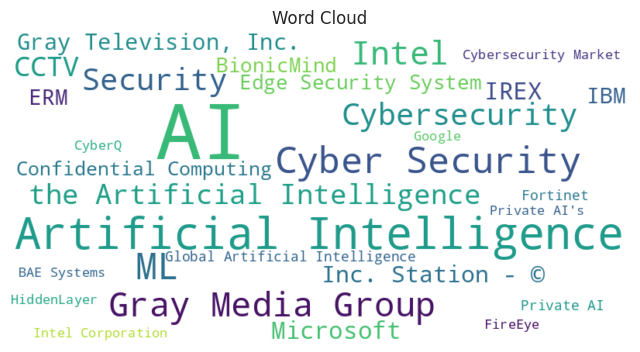

In [212]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


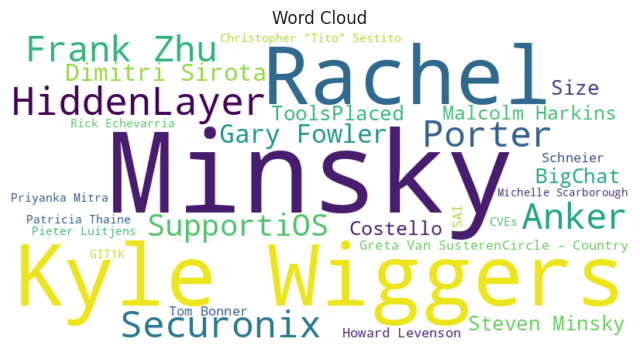

In [213]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


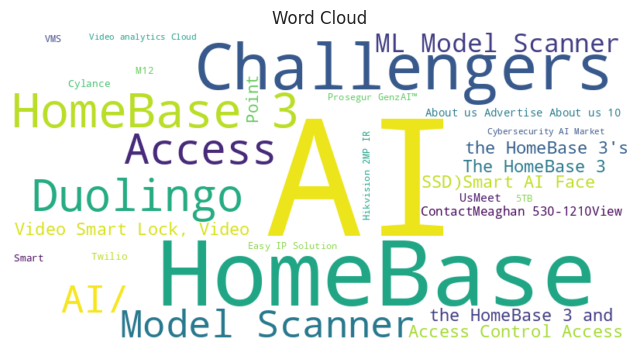

In [214]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 15 - cybersecurity

In [215]:
selected_topics = [15]
cyber_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [216]:
chatgpt_filtered = cyber_df 

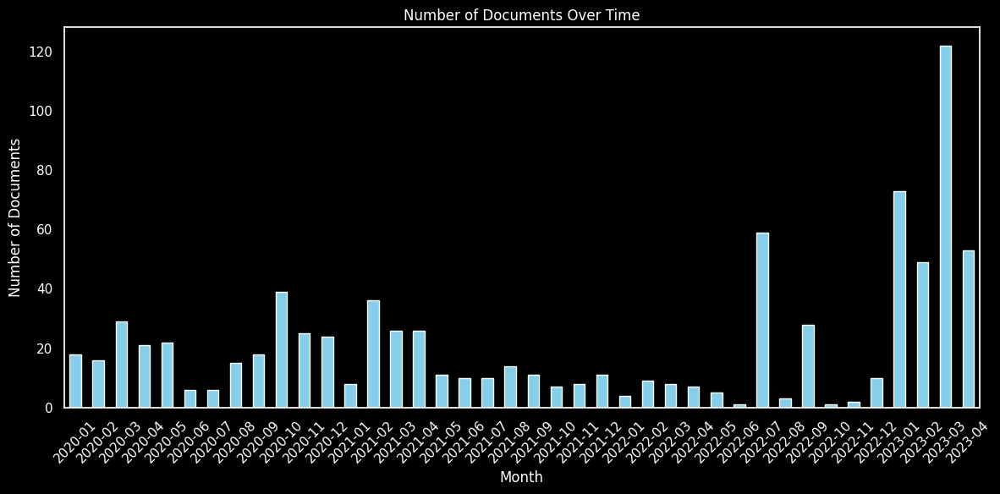

In [217]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [218]:
df_analysis_sample = chatgpt_filtered

In [219]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 405 ms, sys: 40.5 s, total: 41 s
Wall time: 59 s


In [220]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


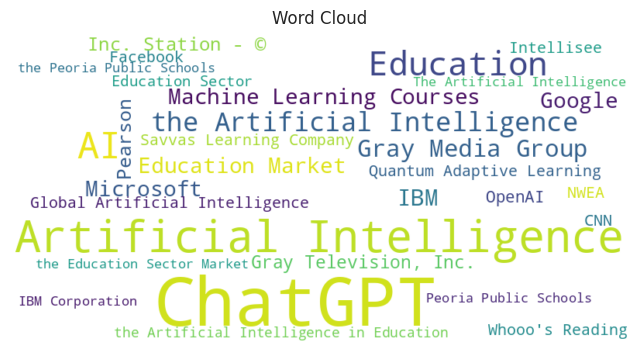

In [221]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


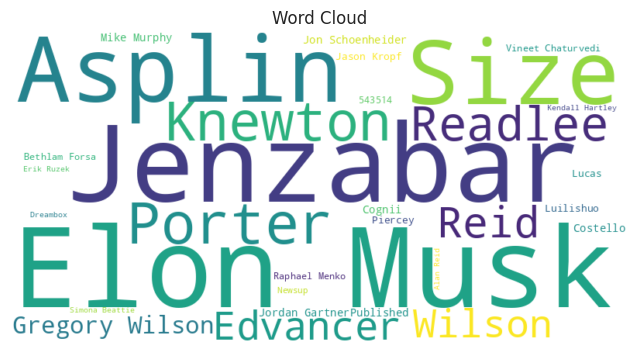

In [222]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


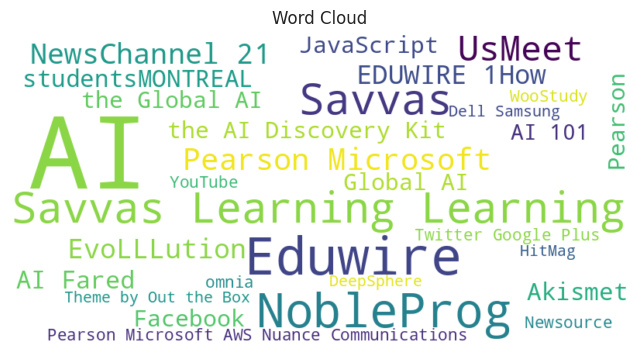

In [223]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 21 - retail fashion

In [224]:
selected_topics = [21]
fashion_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [225]:
chatgpt_filtered = fashion_df 

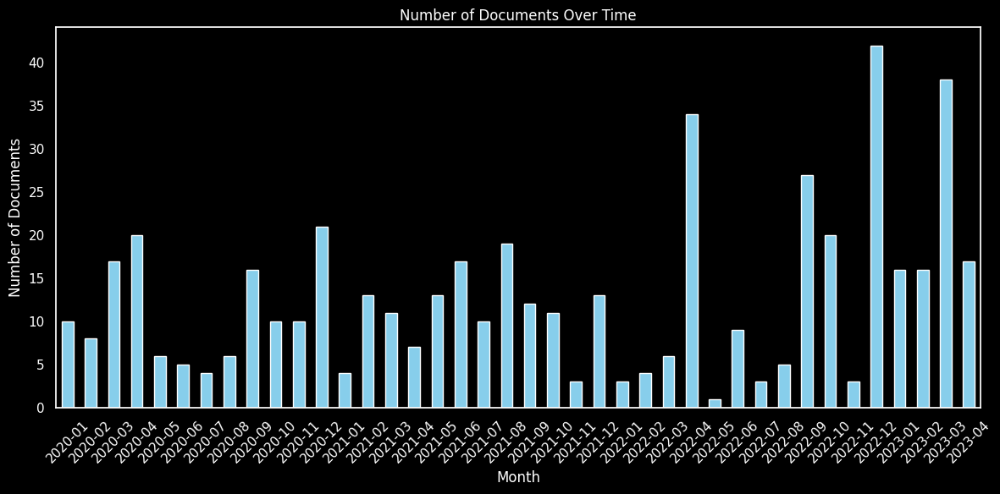

In [226]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [227]:
df_analysis_sample = chatgpt_filtered

In [228]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 264 ms, sys: 39.4 s, total: 39.7 s
Wall time: 50.4 s


In [229]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


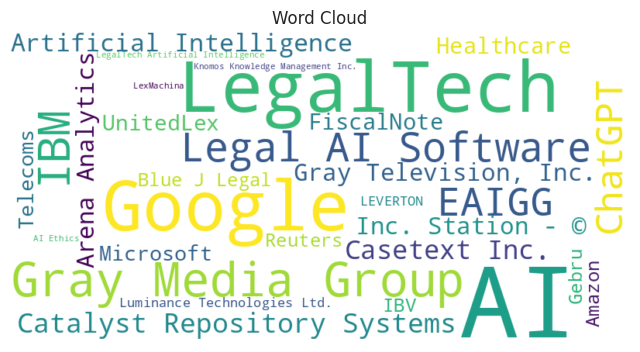

In [230]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


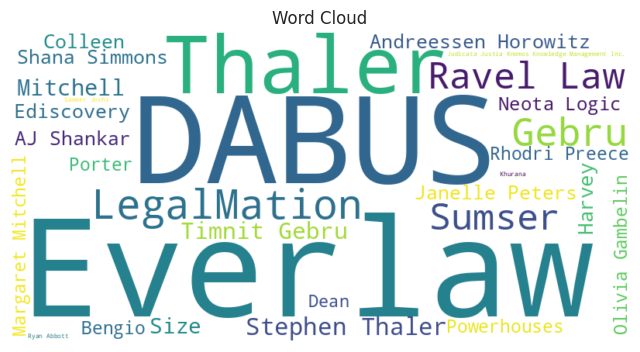

In [231]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


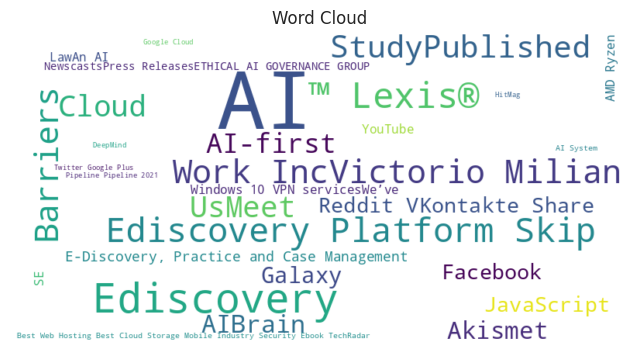

In [232]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 28 - agriculture

In [233]:
selected_topics = [28]
ag_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [234]:
chatgpt_filtered = ag_df 

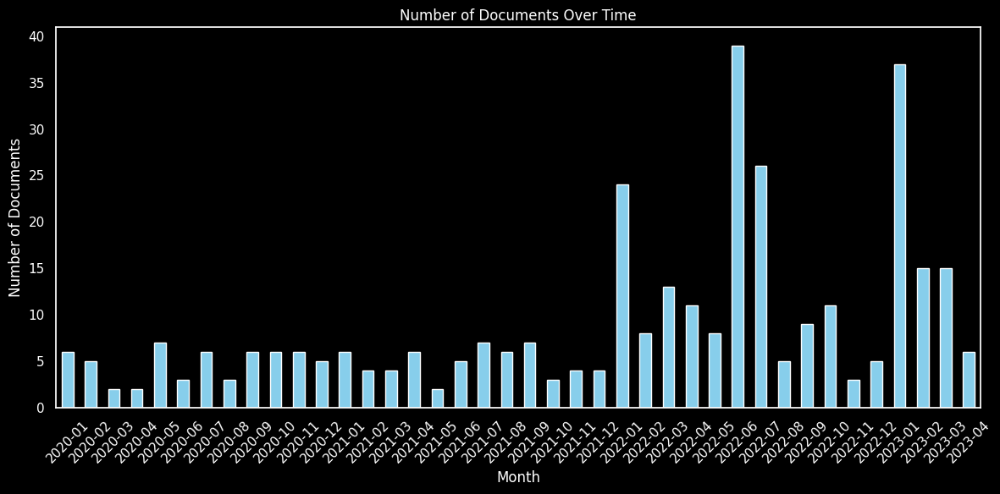

In [235]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [236]:
df_analysis_sample = chatgpt_filtered

In [237]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 185 ms, sys: 39.4 s, total: 39.6 s
Wall time: 47.1 s


In [238]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


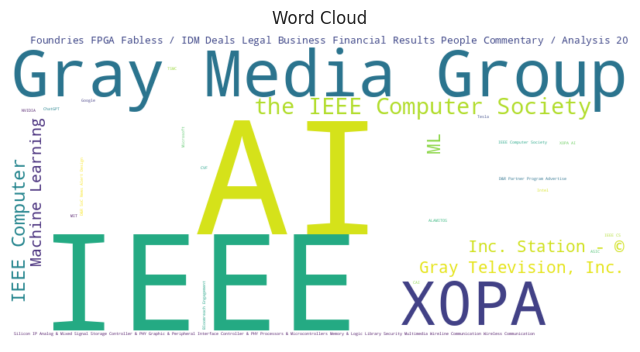

In [239]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


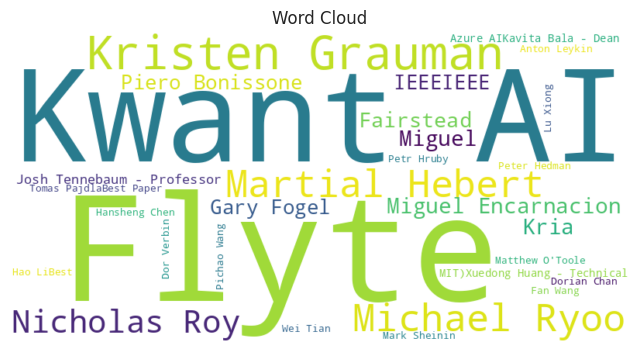

In [240]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


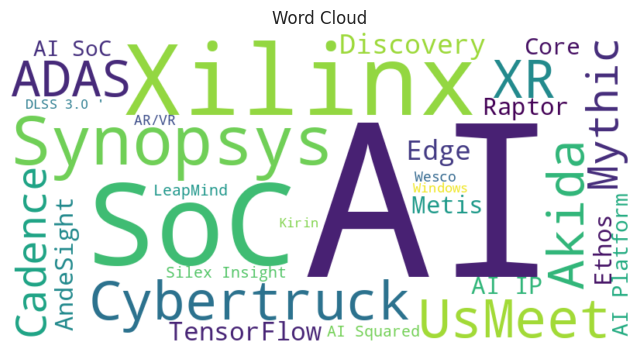

In [241]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 31 - energy intelligence

In [242]:
selected_topics = [31]
energy_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [243]:
chatgpt_filtered = energy_df 

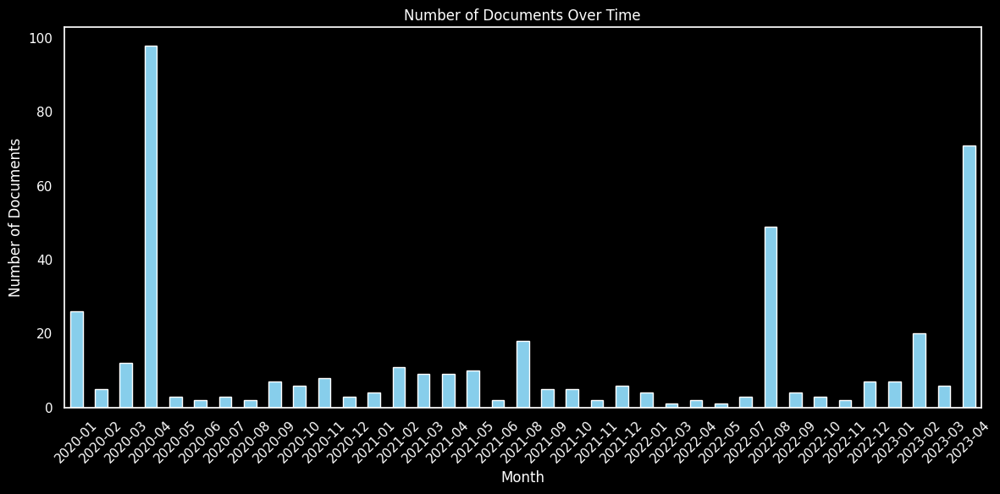

In [244]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [245]:
df_analysis_sample = chatgpt_filtered

In [246]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 283 ms, sys: 39.6 s, total: 39.9 s
Wall time: 1min


In [247]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


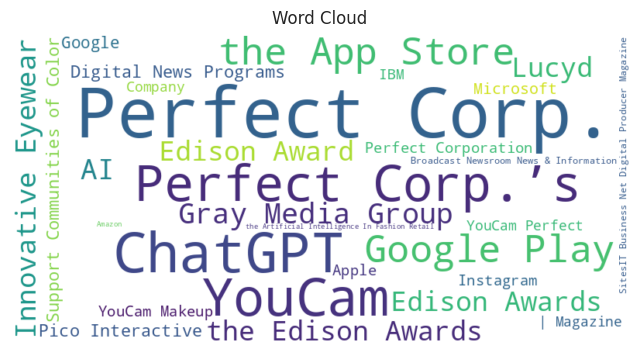

In [248]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


In [ ]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


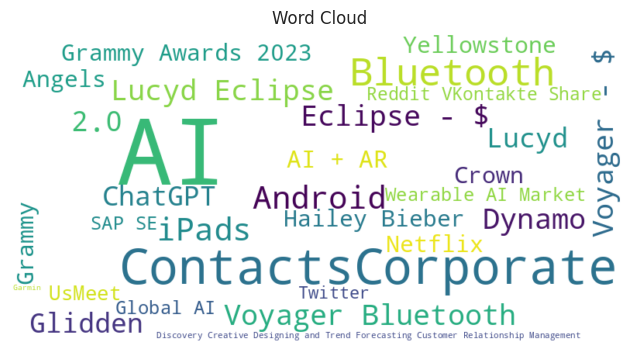

In [249]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 33 - legal tech

In [308]:
selected_topics = [31]
legal_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [309]:
legal_df.head(1)

,Document,Topic,Name,Top_n_words,Probability,Representative_document,date,url,content_clean,clean_title
245,north america artificial intelligence fashion market expected grow us mn us mn year market reports skip content thursday march us team contact us privacy policy market reports packaging market research reports home industry report market report industry analytics market analytics market outlook market research future demands market study opportunities forecast herehomeindustrynorth america artificial intelligence fashion market expected grow us mn us mn year north america artificial intelligence fashion market expected grow us mn us mn year march sameer joshi insight partners announces new...,31,31_fashion_eyewear_intelligence fashion_lucyd,fashion - eyewear - intelligence fashion - lucyd - wearable - market - smart eyewear - fashion market - wearable ai - smart,1.0,False,2021-03-25,https://www.packagingnews24.com/north-america-artificial-intelligence-in-fashion-market-expected-to-grow-from-us-128-7-mn-in-2018-to-us-2254-2-mn-by-the-year-2027/,"North America Artificial Intelligence in Fashion Market expected to grow from US$ 128.7 Mn in 2018 to US$ 2254.2 Mn by the year 2027 – Market Reports Skip to content Thursday, March 25, 2021 About Us Our Team Contact Us Privacy Policy Market Reports Packaging Market Research and Reports Home Industry Report Market Report Industry Analytics Market Analytics Market Outlook Market Research Future Demands Market Study Opportunities Forecast You are America Artificial Intelligence in Fashion Market expected to grow from US$ 128.7 Mn in 2018 to US$ 2254.2 Mn by the year 2027 North America Artifi...",north america artificial intelligence fashion market expected grow us mn us mn year market reports


In [297]:
chatgpt_filtered = legal_df 

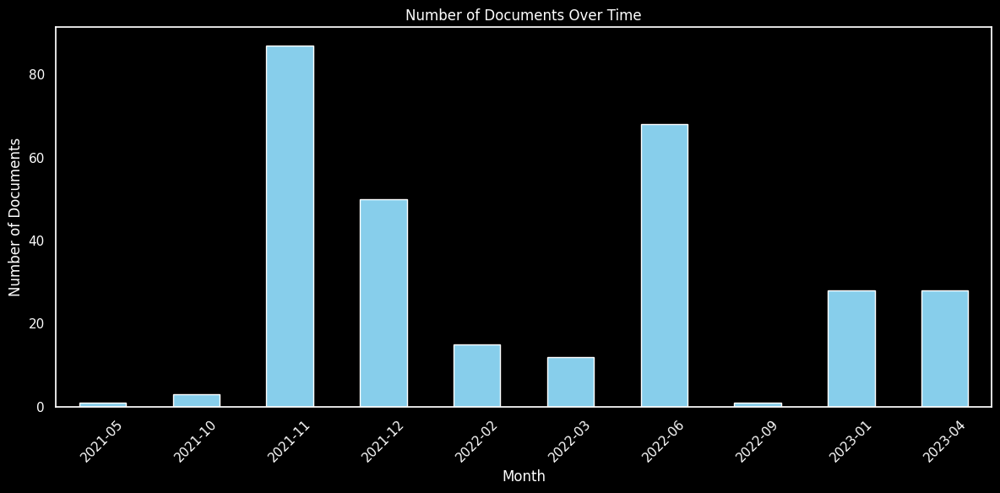

In [298]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [299]:
df_analysis_sample = chatgpt_filtered

In [254]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 207 ms, sys: 41.3 s, total: 41.5 s
Wall time: 39 s


In [255]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


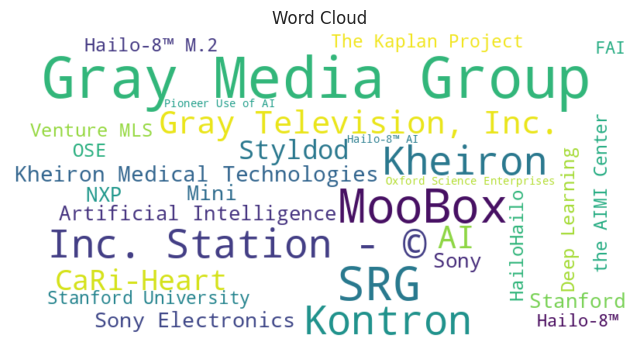

In [256]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


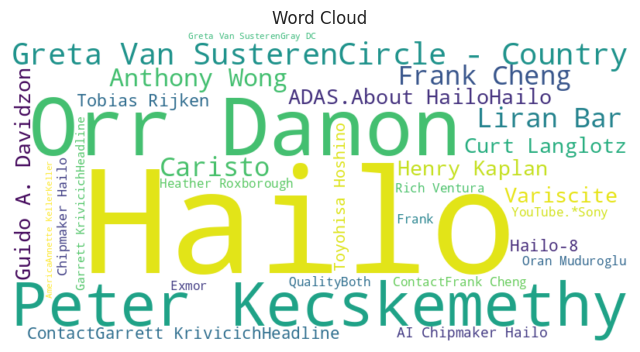

In [257]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


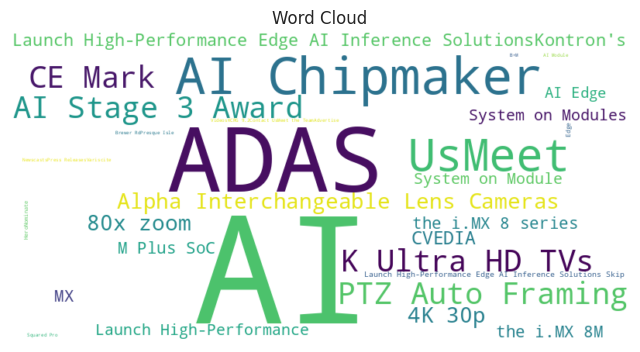

In [258]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 38 - conversational ai

In [259]:
selected_topics = [38]
convai_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [260]:
chatgpt_filtered = convai_df 

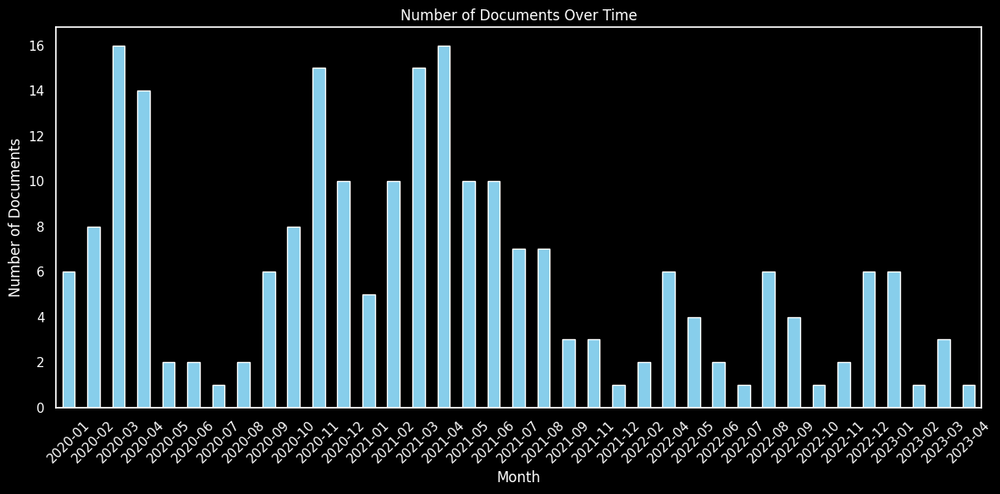

In [261]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [262]:
df_analysis_sample = chatgpt_filtered

In [263]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 316 ms, sys: 38.4 s, total: 38.7 s
Wall time: 1min 13s


In [264]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


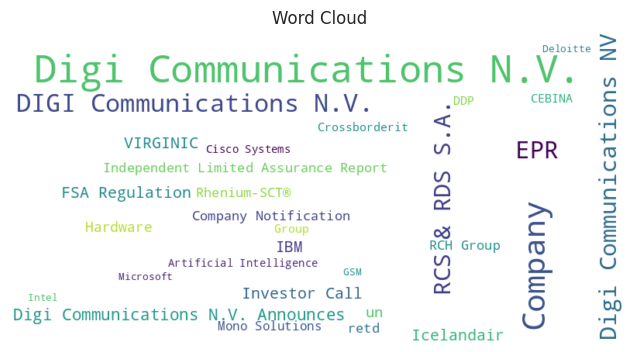

In [265]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


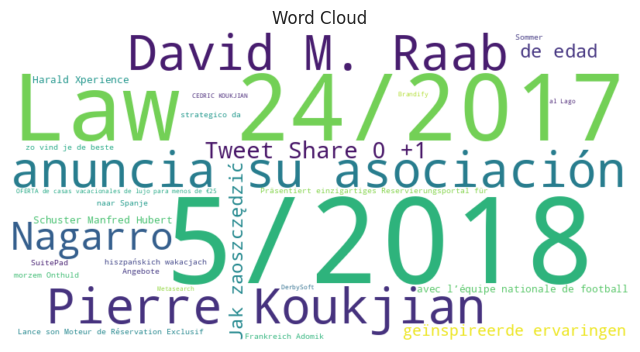

In [266]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


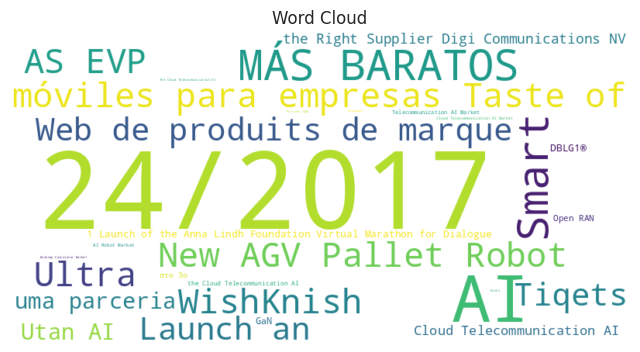

In [267]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 41 - quantam computing

In [268]:
selected_topics = [41]
quantum_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [269]:
chatgpt_filtered = quantum_df 

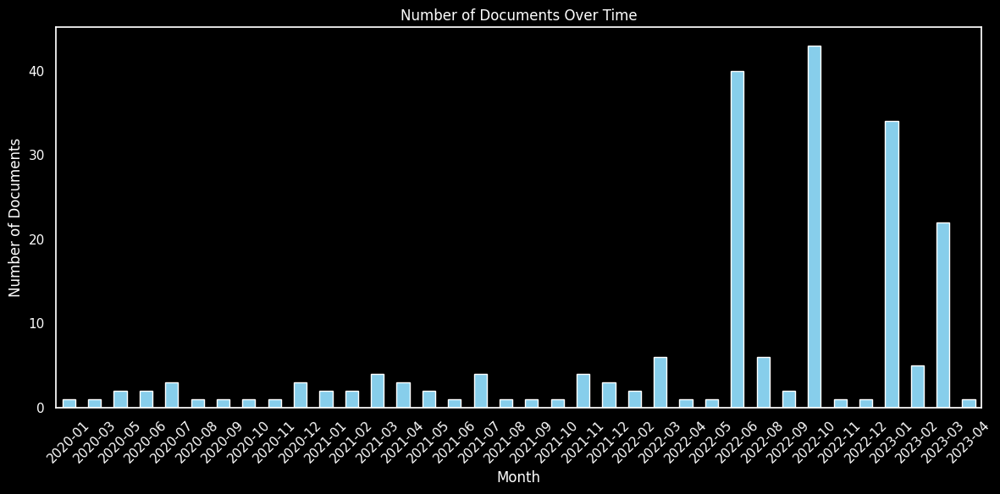

In [270]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [271]:
df_analysis_sample = chatgpt_filtered

In [272]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 203 ms, sys: 39.3 s, total: 39.5 s
Wall time: 38 s


In [273]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


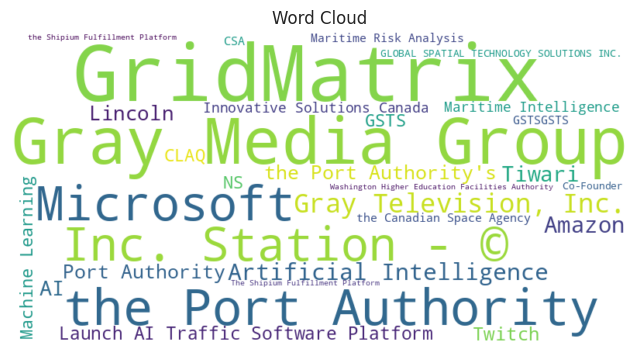

In [274]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


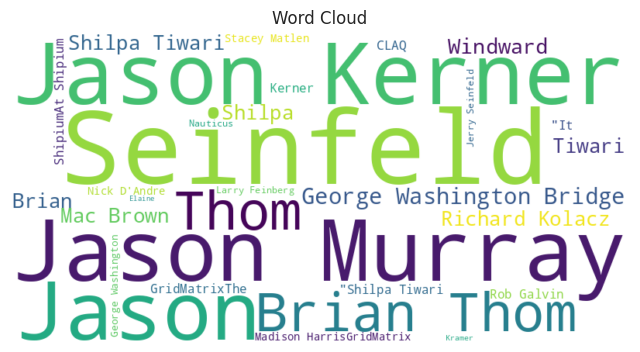

In [275]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


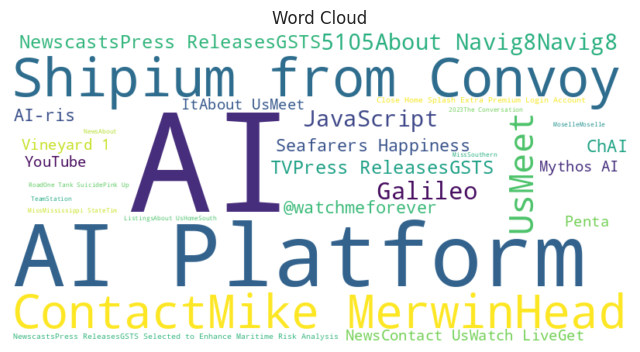

In [276]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 58 - insurance

In [278]:
selected_topics = [58]
insurance_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [279]:
chatgpt_filtered = insurance_df 

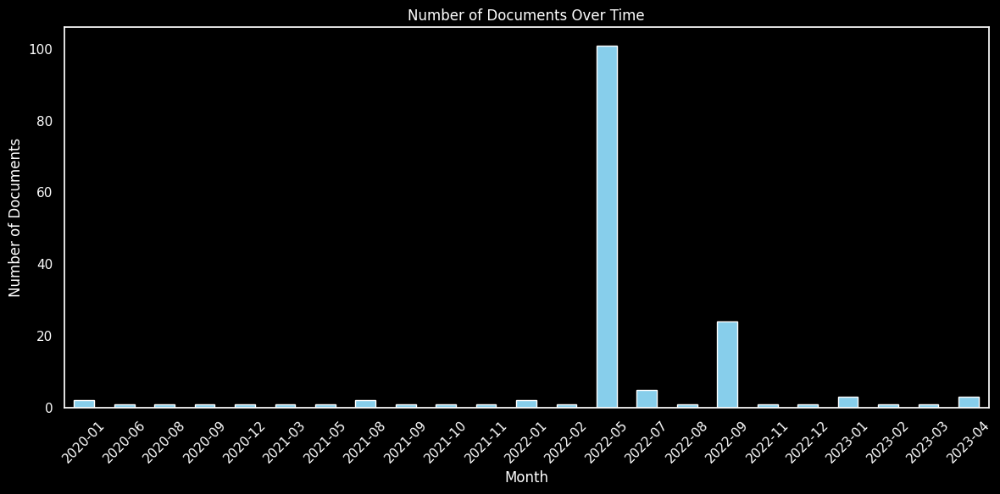

In [280]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [281]:
df_analysis_sample = chatgpt_filtered

In [282]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 217 ms, sys: 39.7 s, total: 39.9 s
Wall time: 39.1 s


In [283]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


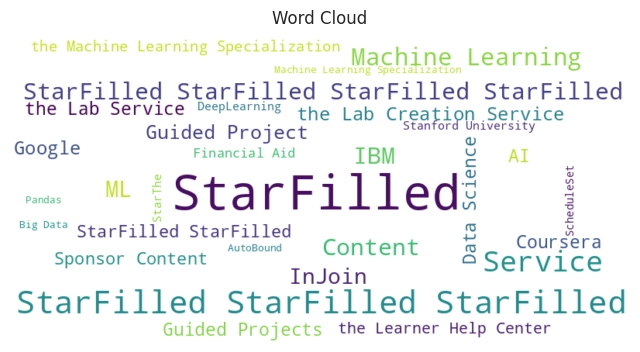

In [284]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


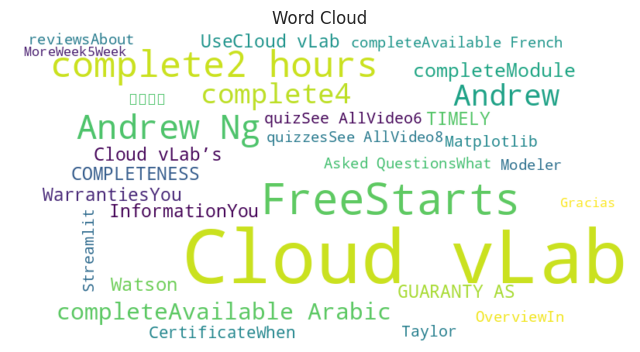

In [285]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


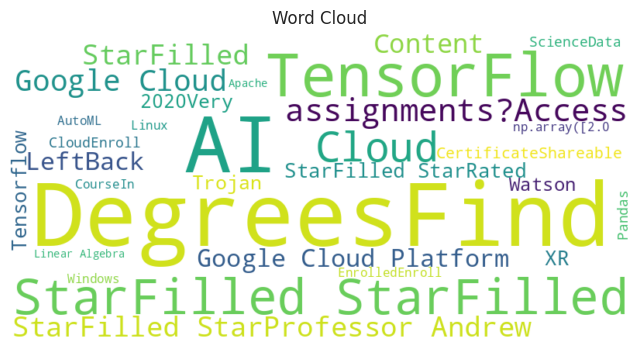

In [286]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


#### topic 71 - oil

In [287]:
selected_topics = [71]
oil_df = df_topics_negative[df_topics_negative['Topic'].isin(selected_topics)]


In [288]:
chatgpt_filtered = oil_df 

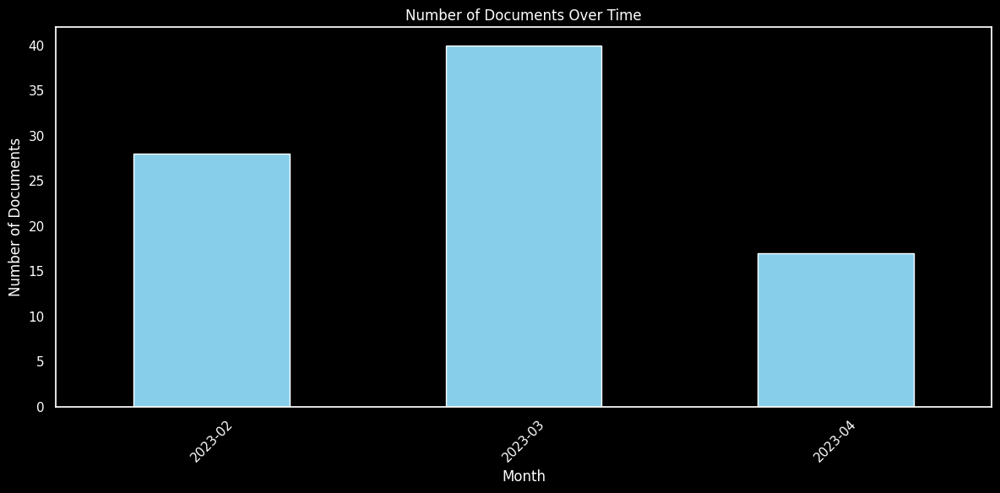

In [289]:
import matplotlib.pyplot as plt

chatgpt_filtered['date'] = pd.to_datetime(chatgpt_filtered['date'])

# Extract the month and year from the 'date' column
chatgpt_filtered['month_year'] = chatgpt_filtered['date'].dt.to_period('M')

# Group the documents by month and count the number of documents in each month
documents_by_month = chatgpt_filtered.groupby('month_year').size()

# Create the bar graph
fig = plt.figure(figsize=(12, 6), facecolor='black')  # Set the figure size and background color
ax = fig.add_subplot(111)
ax.patch.set_facecolor('black')

documents_by_month.plot(kind='bar', color='skyblue', ax=ax)  # Create the bar plot
plt.title('Number of Documents Over Time', color='white')  # Add a title to the plot
plt.xlabel('Month', color='white')  # Add a label to the x-axis
plt.ylabel('Number of Documents', color='white')  # Add a label to the y-axis
plt.xticks(rotation=45, color='white')  # Rotate the x-axis labels for better visibility
plt.yticks(color='white')

ax.spines['bottom'].set_color('white')
ax.spines['top'].set_color('white') 
ax.spines['right'].set_color('white')
ax.spines['left'].set_color('white')

ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')

ax.grid(False)  # Remove gridlines

plt.tight_layout()  # Adjust the spacing
plt.show()  # Show the plot


In [290]:
df_analysis_sample = chatgpt_filtered

In [291]:
%%time
df_analysis_sample['date'] = pd.to_datetime(df_analysis_sample['date'])

# Define the entity labels of interest
entity_labels = ['ORG', 'PRODUCT', 'PERSON']

# Function to extract entities by label from a single document
def extract_entities(row, label):
    doc = nlp(row['content_clean'])
    entities = [ent.text for ent in doc.ents if ent.label_ == label]
    return entities

# Add year column to dataframe for future use
df_analysis_sample['year'] = df_analysis_sample['date'].dt.year

# Dictionary to store top entities DataFrames by label
df_entities_by_label = {}

# Iterate over each entity label
for label in entity_labels:
    df_analysis_sample[label] = df_analysis_sample.parallel_apply(extract_entities, args=(label,), axis=1)

    # Generate a dataframe where rows correspond to entities, columns correspond to years, and cells contain counts
    entities_by_year = df_analysis_sample.groupby('year')[label].sum().apply(pd.Series.value_counts).unstack().fillna(0)
    
    # Sort the entities by their counts for each year and keep top N entities
    N = 30  # you can change this to keep as many top entities as you like
    top_entities_by_year = entities_by_year.apply(lambda x: x.nlargest(N) if isinstance(x, pd.Series) else x).unstack()

    df_entities_by_label[label] = top_entities_by_year


CPU times: user 116 ms, sys: 41.1 s, total: 41.2 s
Wall time: 36.6 s


In [292]:
# Example: Accessing the top entities for 'ORG'
top_org_entities = df_entities_by_label['ORG']
top_person_entities = df_entities_by_label['PERSON']
top_product_entities = df_entities_by_label['PRODUCT']


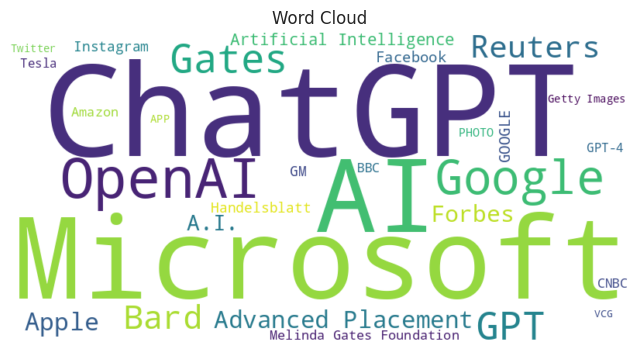

In [293]:

df = top_org_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


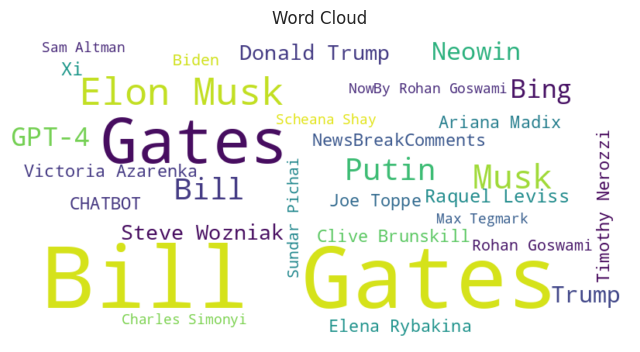

In [294]:

df = top_person_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


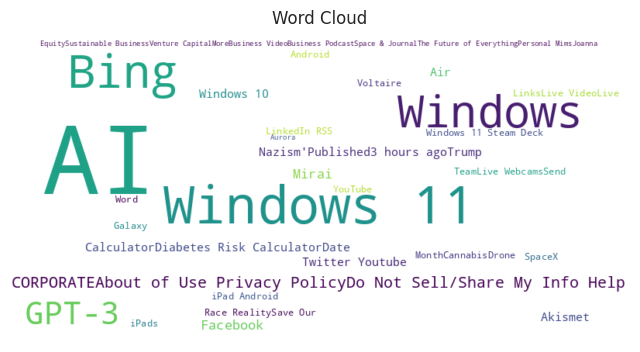

In [295]:

df = top_product_entities
# Calculate total mentions across all years for each entity
df['total'] = df.sum(axis=1)

# Sort the DataFrame by the total column in descending order
df_sorted = df.sort_values('total', ascending=False)

# Select the top 30 rows (entities)
df_top30 = df_sorted.head(30)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400, colormap='viridis')

# Generate the word cloud from the total mentions
wordcloud.generate_from_frequencies(df_top30['total'])

# Plot the word cloud
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()


In [ ]:

#topic 2 - chatgpt
#topic 4 - healthcare (topic 19 - drug discovery)(topic 24 - covid coronavirus)
#topic 5 - computer vision
#topic 7 - automative / tesla
#topic 8 - nvidia
#topic 9 - military intelligence aviation defense
#topic 11 - intelligence education
#topic 15 - cybersecurity
#topic 21 - retail fashion
#topic 22 - iot
#topic 28 - agriculture
#topic 31 - energy intelligence
#topic 32 - food intellgience ai
#topic 33 - legal tech
#topic 34 - dentists
#topic 38 - conversational ai
#topic 41 - quantum computing
#topic 58 - insurance
#topic 71 - oil